# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- Company: Name of the company
- GICS Sector: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- GICS Sub Industry: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- Current Price: Current stock price in dollars
- Price Change: Percentage change in the stock price in 13 weeks
- Volatility: Standard deviation of the stock price over the past 13 weeks
- ROE: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- Cash Ratio: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- Net Cash Flow: The difference between a company's cash inflows and outflows (in dollars)
- Net Income: Revenues minus expenses, interest, and taxes (in dollars)
- Earnings Per Share: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- Estimated Shares Outstanding: Company's stock currently held by all its shareholders
- P/E Ratio: Ratio of the company's current stock price to the earnings per share
- P/B Ratio: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Importing necessary libraries and data

In [1]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.6.1 seaborn==0.13.2 matplotlib==3.10.0 numpy==2.0.2 pandas==2.2.2 yellowbrick==1.5 -q --user

In [2]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.2 yellowbrick==1.5 -q --user
# !pip install --upgrade -q jinja2

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [3]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler, RobustScaler
from scipy.stats import zscore

# to compute distances
from scipy.spatial.distance import cdist

# to perform k-means clustering and compute silhouette scores
from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from sklearn.linear_model import LinearRegression

# to compute distances
from scipy.spatial.distance import pdist

# to perform PCA
from sklearn.decomposition import PCA

# to ignore unnecessary warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
path = "/content/drive/MyDrive/UT DS Grad Cert/Project6/"
df = pd.read_csv(path + "stock_data.csv")

## Custom Functions and Defaults

In [6]:
# set defaults for the notebook

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 50)

#set a gray background grid for all visualizations
sns.set_style("darkgrid")

#turn off scientific notation
pd.set_option('display.float_format', lambda x: '%.2f' % x)
np.set_printoptions(suppress=True)

#change default graph size
plt.rcParams['figure.figsize'] = [15, 6]

In [7]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [8]:
def histogram_boxplot(data, feature, figsize=(15, 10), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (15,10))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

    plt.show() # Display the plots

    # Add summary statistics
    print(f"\nSummary Statistics for {feature}:")
    print(data[feature].describe().to_string(float_format='{:,.2f}'.format))

In [9]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

## Data Overview

- Observations
- Sanity checks

In [10]:
df.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.35,10.00,1.69,135,51,-604000000,7610000000,11.39,668129938.50,3.72,-8.78
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.24,8.34,2.20,130,77,51000000,5144000000,3.15,1633015873.00,18.81,-8.75
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.91,11.30,1.27,21,67,938000000,4423000000,2.94,1504421769.00,15.28,-0.39
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.94,13.98,1.36,9,180,-240840000,629551000,1.26,499643650.80,74.56,4.20
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.32,-1.83,1.70,14,272,315120000,696878000,0.31,2247993548.00,178.45,1.06


In [11]:
df.tail()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
335,YHOO,Yahoo Inc.,Information Technology,Internet Software & Services,33.26,14.89,1.85,15,459,-1032187000,-4359082000,-4.64,939457327.60,28.98,6.26
336,YUM,Yum! Brands Inc,Consumer Discretionary,Restaurants,52.52,-8.70,1.48,142,27,159000000,1293000000,2.97,435353535.40,17.68,-3.84
337,ZBH,Zimmer Biomet Holdings,Health Care,Health Care Equipment,102.59,9.35,1.40,1,100,376000000,147000000,0.78,188461538.50,131.53,-23.88
338,ZION,Zions Bancorp,Financials,Regional Banks,27.30,-1.16,1.47,4,99,-43623000,309471000,1.20,257892500.00,22.75,-0.06
339,ZTS,Zoetis,Health Care,Pharmaceuticals,47.92,16.68,1.61,32,65,272000000,339000000,0.68,498529411.80,70.47,1.72


In [12]:
df.shape

(340, 15)

The data consists of 340 observations across 15 variables.

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

There are 4 categorical variables: Ticker symbol, Security, GICS Sectors and GICS Sub Industry.  The other 11 are numeric.

In [14]:
df.isna().sum()

,0
Ticker Symbol,0
Security,0
GICS Sector,0
GICS Sub Industry,0
Current Price,0
Price Change,0
Volatility,0
ROE,0
Cash Ratio,0
Net Cash Flow,0


There are no obviously missing values.

In [15]:
df.nunique()

,0
Ticker Symbol,340
Security,340
GICS Sector,11
GICS Sub Industry,104
Current Price,336
Price Change,340
Volatility,340
ROE,82
Cash Ratio,124
Net Cash Flow,332


As expected the Ticker Symbol and Security (company name) are fully unique. Many of the other variables are fully unique as expected of floating values.  

## <a name = "link2">Exploratory Data Analysis (EDA)</a>

A full EDA can be found in the <a href = "#link1">Appendix</a>

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What does the distribution of stock prices look like?
2. The stocks of which economic sector have seen the maximum price increase on average?
3. How are the different variables correlated with each other?
4. Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?
5. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?

In [16]:
data = df.copy()

### Observations on `Current Price`

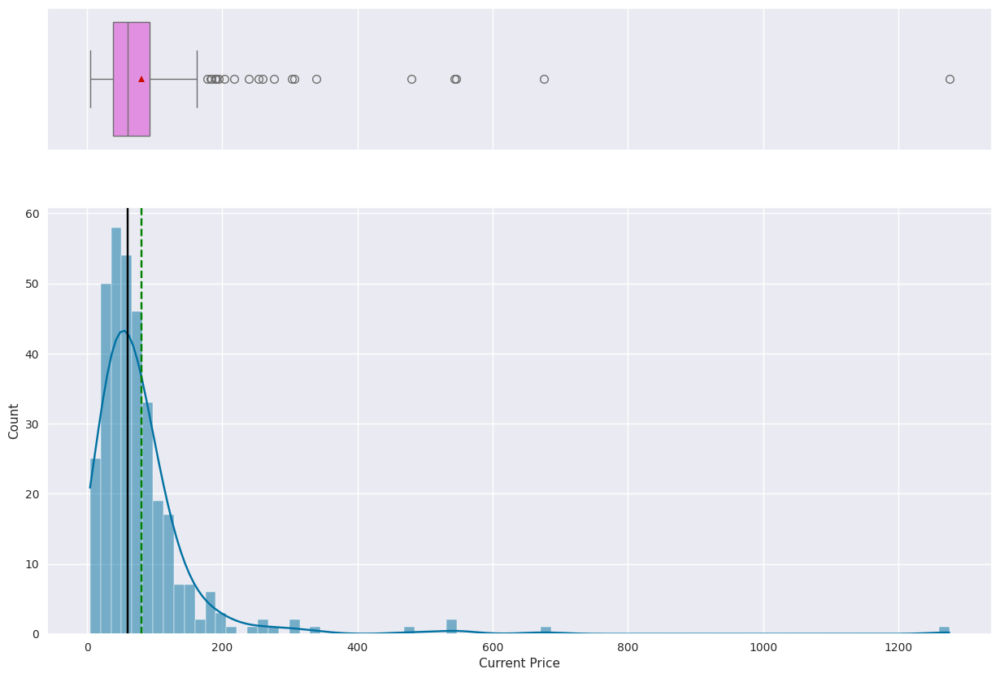


Summary Statistics for Current Price:
count     340.00
mean       80.86
std        98.06
min         4.50
25%        38.55
50%        59.70
75%        92.88
max     1,274.95


In [17]:
histogram_boxplot(data, 'Current Price', kde=True)

Current price is right skewed.  The mean is \$80.86 with a standard deviation of \$98.06.  The median stock price is \$59.71.

### Observations on `Current Price` by `GICS Sector`

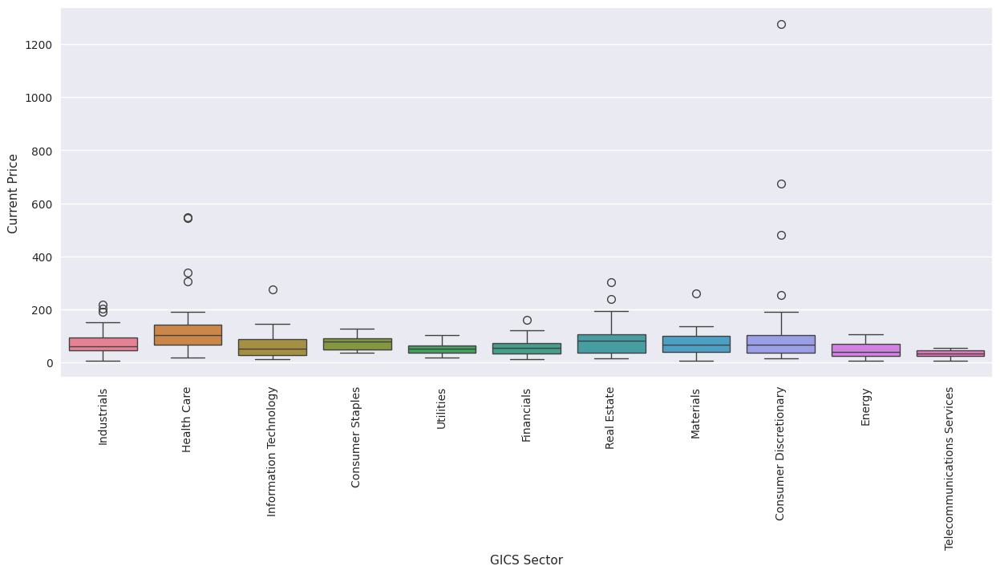

Mean Price by GICS Sector:
GICS Sector
Consumer Discretionary        128.10
Consumer Staples               71.97
Energy                         46.04
Financials                     58.66
Health Care                   132.05
Industrials                    74.41
Information Technology         63.55
Materials                      76.55
Real Estate                    90.98
Telecommunications Services    32.96
Utilities                      52.97
Name: Current Price, dtype: float64


In [18]:
sns.boxplot(data=data, x='GICS Sector', y='Current Price', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Price by GICS Sector:\n{data.groupby('GICS Sector')['Current Price'].mean()}")

The price is fairly uniformly distributed across the different sectors.  However, there are high end outliers in seven of the sectors.  Health care, Consumer Discretionary, and Real Estate have the highest average stock price overall. However, the high Health Care average may be due to high-end outliers. Telecommunications and Energy have the lowest average stock price overall.

###Observations on `Price Change` by `GICS Sector`

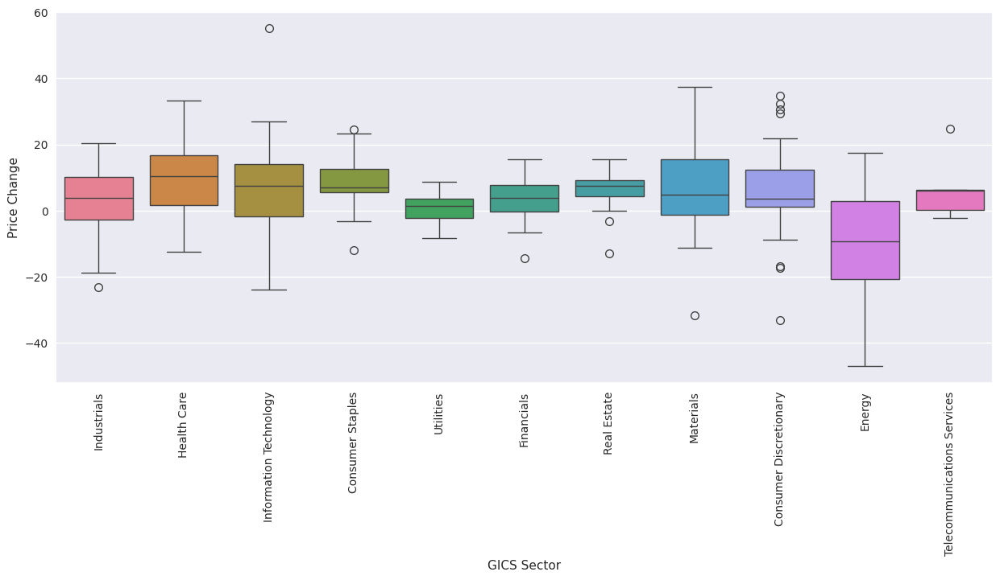

Mean Price Change by GICS Sector:
GICS Sector
Consumer Discretionary          5.85
Consumer Staples                8.68
Energy                        -10.23
Financials                      3.87
Health Care                     9.59
Industrials                     2.83
Information Technology          7.22
Materials                       5.59
Real Estate                     6.21
Telecommunications Services     6.96
Utilities                       0.80
Name: Price Change, dtype: float64


In [19]:
sns.boxplot(data=data, x='GICS Sector', y='Price Change', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Price Change by GICS Sector:\n{data.groupby('GICS Sector')['Price Change'].mean()}")

Energy as a sector has an overall negative growth.  Other sectors, such as Utilities and Industrials show very limited average change in prices.  Health Care, Consumer Staples, and Information Technology, all appear to have the largest postive average price change as industries.

###Observations on Bivariate Numerical Variables

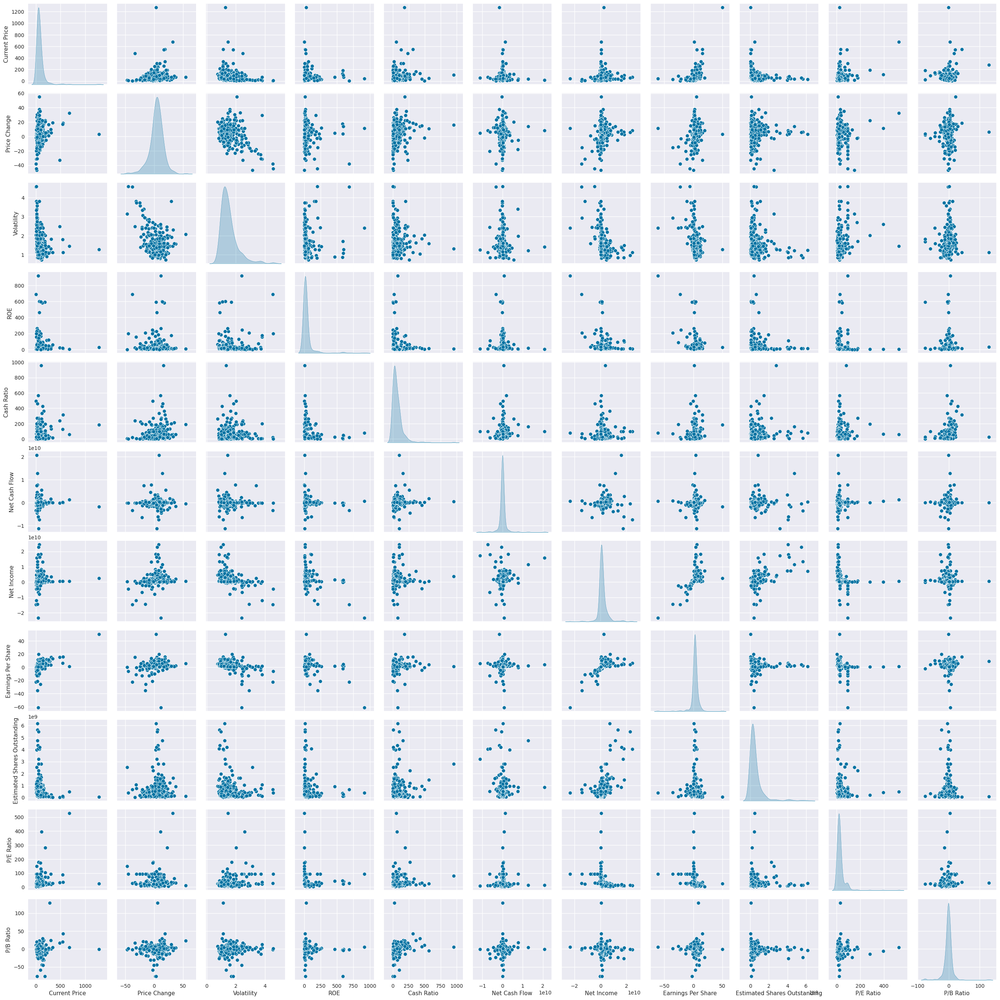

In [20]:
#pairplots of all numerica variables in eda
sns.pairplot(data, diag_kind = "kde")
plt.show()

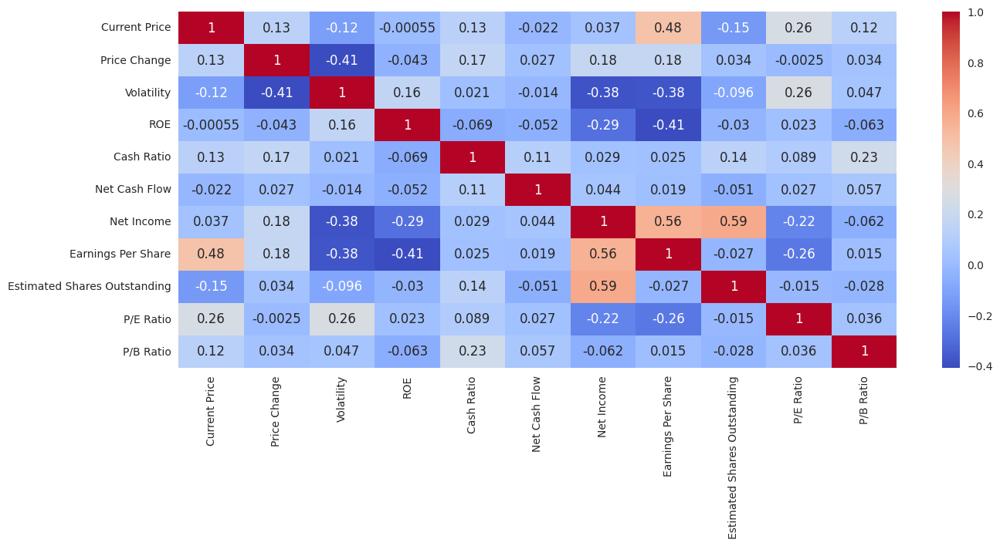

In [21]:
#pull all numerical variables from the eda dataset
data_corr_matrix = data.corr(numeric_only=True)
sns.heatmap(data_corr_matrix, annot = True, cmap = 'coolwarm')
plt.show()

As seen in the pairplot and correlation matrix above, earnings per share is moderately correlated with current price and net income.  Estimated shares outstanding is positively correlated with net income. Volatility is negatively correlated with net income, earnings per share, and price change. Whiel ROE is negatively correlated with earnings per share. Other variables may have non-linear correlations, such as Estimated shares outstanding and current price, which appear to have an exponential relationship.

###Observations on `Cash Ratio` by `GICS Sector`

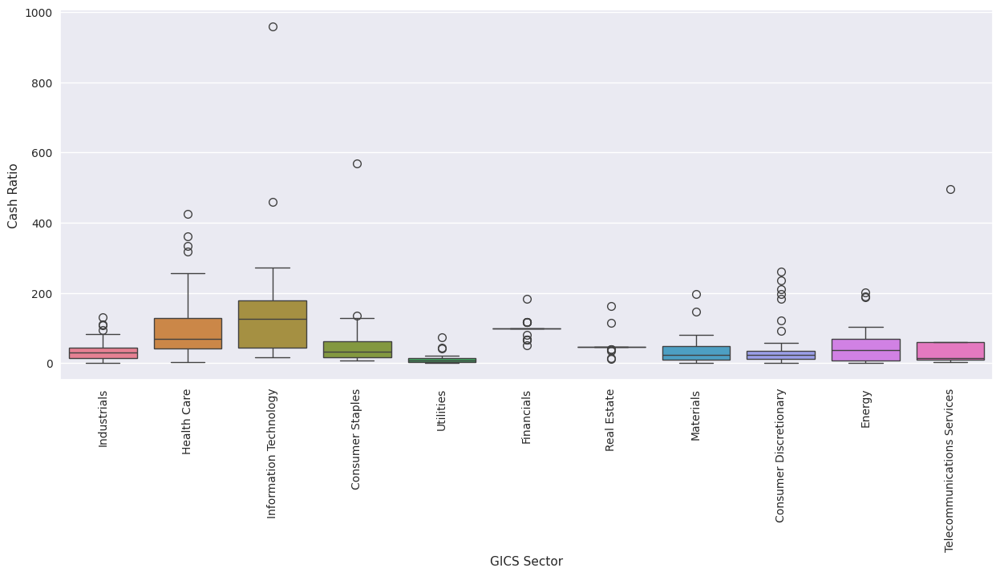

Mean Cash Ratio by GICS Sector:
GICS Sector
Consumer Discretionary         49.58
Consumer Staples               70.95
Energy                         51.13
Financials                     98.59
Health Care                   103.78
Industrials                    36.19
Information Technology        149.82
Materials                      41.70
Real Estate                    50.11
Telecommunications Services   117.00
Utilities                      13.62
Name: Cash Ratio, dtype: float64


In [22]:
sns.boxplot(data=data, x='GICS Sector', y='Cash Ratio', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Cash Ratio by GICS Sector:\n{data.groupby('GICS Sector')['Cash Ratio'].mean()}")

There is quite a bit of difference in the Cash Ratio based on sectors.  Sectors with the greatest cash ratio are Information Technology, Telecommunications Services and Health Care.  The industries with the lowest cash ratio are Utilities, Industrials, and Materials.

###Observations on `P/E Ratio` by `GICS Sector`

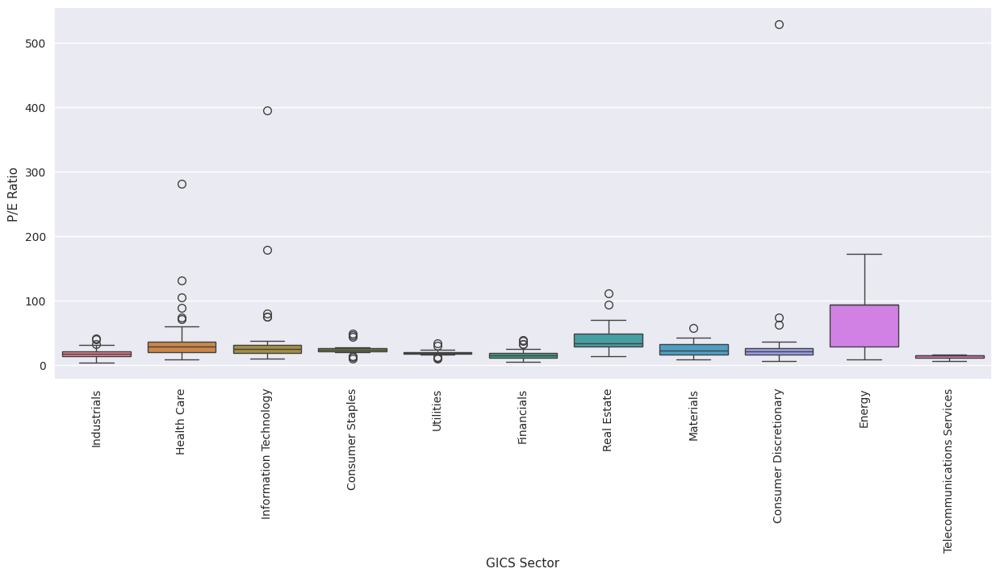

Mean P/E Ratio by GICS Sector:
GICS Sector
Consumer Discretionary        35.21
Consumer Staples              25.52
Energy                        72.90
Financials                    16.02
Health Care                   41.14
Industrials                   18.26
Information Technology        43.78
Materials                     24.59
Real Estate                   43.07
Telecommunications Services   12.22
Utilities                     18.72
Name: P/E Ratio, dtype: float64


In [23]:
sns.boxplot(data=data, x='GICS Sector', y='P/E Ratio', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean P/E Ratio by GICS Sector:\n{data.groupby('GICS Sector')['P/E Ratio'].mean()}")

Energy, Information Technology, and Real Estate have the highest average P/E Ratios while Telecommunication Services, Industrials, and Utilities have the lowest.  However, from this ratio alone, it is impossible to tell whether the high P/E companies are expected to bring more return or if they are over-valued.  Likewise, it is impossible to tell if the low P/E sectors are under-valued or if their investors do not expect a high return.

## Data Preprocessing

- Duplicate value check
- Missing value treatment
- Outlier check
- Feature engineering (if needed)
- Any other preprocessing steps (if needed)

###Duplicate Value Checks

In [24]:
#checking for duplicated values
data.duplicated().sum()

np.int64(0)

There are no duplicated values.

###Missing value treatment

In [25]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

,0
Ticker Symbol,0.00
Security,0.00
GICS Sector,0.00
GICS Sub Industry,0.00
Current Price,0.00
Price Change,0.00
Volatility,0.00
ROE,0.00
Cash Ratio,0.00
Net Cash Flow,0.00


There are no coded missing values in the dataset.

In [26]:
# Let's look at the statistical summary of the data
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Ticker Symbol,340,340,ZTS,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Security,340,340,Zoetis,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current Price,340.00,NaN,NaN,NaN,80.86,98.06,4.50,38.55,59.70,92.88,1274.95
Price Change,340.00,NaN,NaN,NaN,4.08,12.01,-47.13,-0.94,4.82,10.70,55.05
Volatility,340.00,NaN,NaN,NaN,1.53,0.59,0.73,1.13,1.39,1.70,4.58
ROE,340.00,NaN,NaN,NaN,39.60,96.55,1.00,9.75,15.00,27.00,917.00
Cash Ratio,340.00,NaN,NaN,NaN,70.02,90.42,0.00,18.00,47.00,99.00,958.00
Net Cash Flow,340.00,NaN,NaN,NaN,55537620.59,1946365312.18,-11208000000.00,-193906500.00,2098000.00,169810750.00,20764000000.00


In [27]:
# Let's see unique values
cols = data.columns

for col in cols:
    print("Unique values in the column '{}' are \n\n".format(col), data[col].unique())
    print("-" * 100)

Unique values in the column 'Ticker Symbol' are 

 ['AAL' 'ABBV' 'ABT' 'ADBE' 'ADI' 'ADM' 'ADS' 'AEE' 'AEP' 'AFL' 'AIG' 'AIV'
 'AIZ' 'AJG' 'AKAM' 'ALB' 'ALK' 'ALL' 'ALLE' 'ALXN' 'AMAT' 'AME' 'AMG'
 'AMGN' 'AMP' 'AMT' 'AMZN' 'AN' 'ANTM' 'AON' 'APA' 'APC' 'APH' 'ARNC'
 'ATVI' 'AVB' 'AVGO' 'AWK' 'AXP' 'BA' 'BAC' 'BAX' 'BBT' 'BCR' 'BHI' 'BIIB'
 'BK' 'BLL' 'BMY' 'BSX' 'BWA' 'BXP' 'C' 'CAT' 'CB' 'CBG' 'CCI' 'CCL'
 'CELG' 'CF' 'CFG' 'CHD' 'CHK' 'CHRW' 'CHTR' 'CI' 'CINF' 'CL' 'CMA' 'CME'
 'CMG' 'CMI' 'CMS' 'CNC' 'CNP' 'COF' 'COG' 'COO' 'CSX' 'CTL' 'CTSH' 'CTXS'
 'CVS' 'CVX' 'CXO' 'D' 'DAL' 'DD' 'DE' 'DFS' 'DGX' 'DHR' 'DIS' 'DISCA'
 'DISCK' 'DLPH' 'DLR' 'DNB' 'DOV' 'DPS' 'DUK' 'DVA' 'DVN' 'EBAY' 'ECL'
 'ED' 'EFX' 'EIX' 'EMN' 'EOG' 'EQIX' 'EQR' 'EQT' 'ES' 'ESS' 'ETFC' 'ETN'
 'ETR' 'EW' 'EXC' 'EXPD' 'EXPE' 'EXR' 'F' 'FAST' 'FB' 'FBHS' 'FCX' 'FE'
 'FIS' 'FISV' 'FLIR' 'FLR' 'FLS' 'FMC' 'FRT' 'FSLR' 'FTR' 'GD' 'GGP'
 'GILD' 'GLW' 'GM' 'GPC' 'GRMN' 'GT' 'GWW' 'HAL' 'HAS' 'HBAN' 'HCA' 'HCN'
 'HCP' 'HE

Based upon the statistical summary and upon a cursory examination of the unique values, all values with each variable appear to be consistent in terms of data types.  No treatment of missing values appears to be necessary.

###Outlier Checks

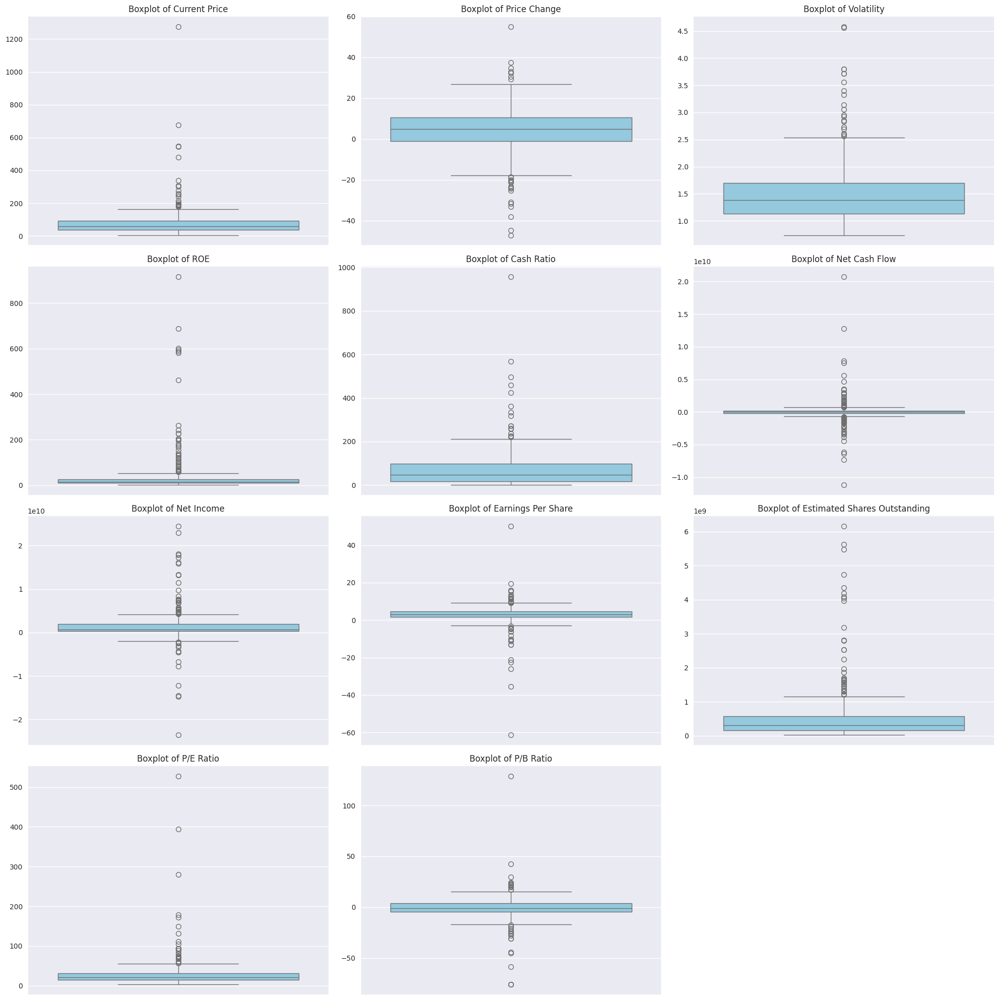

In [28]:
#a grid of boxplots for all numerical variables in the data dataframe

# Identify numerical columns
numerical_cols = data.select_dtypes(include=np.number).columns.tolist()

# Create a figure and a set of subplots with 4 rows and 3 columns
fig, axes = plt.subplots(4, 3, figsize=(20, 20))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Loop through each numerical column and create a boxplot
for i, col in enumerate(numerical_cols):
    if i < len(axes): # Ensure we don't go out of bounds if there are more columns than subplots
        sns.boxplot(y=data[col], ax=axes[i], color='skyblue')
        axes[i].set_title(f'Boxplot of {col}', fontsize=12)
        axes[i].set_ylabel('') # Remove y-label to avoid clutter

# Hide any unused subplots
for j in range(len(numerical_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()

Every single variable has outliers, many of which are in both directions.  None of the outliers seem to be so unusual that they are worth treating.  However, the presence of these outliers may affect the clustering results, even with scaling.  As a result, it may be worth scaling the data using both standard scaling and robust scaling and comparing the models against one another.

###Feature Engineering
Since this is an exploration of the data using unsupervised learing, I will not be doing any feature engineering.  My concern would be to  introduce bias into my data before applying the different cluster methods.  This could create self-fulfilling clustering on one-hand and introduce more noise on the other.

###Data Scaling

In [29]:
# Scaling the data set before clustering
std_scaler = StandardScaler()
robust_scaler = RobustScaler()
subset = data[numerical_cols].copy()
std_scaled = std_scaler.fit_transform(subset)
robust_scaled = robust_scaler.fit_transform(subset)

In [30]:
# Creating a dataframe from the scaled data
subset_std_scaled_df = pd.DataFrame(std_scaled, columns=subset.columns)
subset_robust_scaled_df = pd.DataFrame(robust_scaled, columns=subset.columns)

In [31]:
subset_std_scaled_df.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,-0.39,0.49,0.27,0.99,-0.21,-0.34,1.55,1.31,0.11,-0.65,-0.51
1,-0.22,0.36,1.14,0.94,0.08,-0.00,0.93,0.06,1.25,-0.31,-0.50
2,-0.37,0.60,-0.43,-0.19,-0.03,0.45,0.74,0.02,1.10,-0.39,0.09
3,0.13,0.83,-0.28,-0.32,1.22,-0.15,-0.22,-0.23,-0.09,0.95,0.42
4,-0.26,-0.49,0.30,-0.27,2.24,0.13,-0.20,-0.37,1.98,3.29,0.20


In [32]:
subset_robust_scaled_df.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,-0.32,0.45,0.54,6.96,0.05,-1.67,4.46,2.77,0.87,-1.02,-0.93
1,-0.01,0.30,1.45,6.67,0.37,0.13,2.87,0.08,3.19,-0.12,-0.93
2,-0.27,0.56,-0.20,0.35,0.25,2.57,2.40,0.01,2.88,-0.33,0.08
3,0.63,0.79,-0.05,-0.35,1.64,-0.67,-0.05,-0.53,0.46,3.21,0.64
4,-0.08,-0.57,0.56,-0.06,2.78,0.86,-0.01,-0.84,4.68,9.43,0.26


## EDA

- No follow up EDA is necessary since the variables have remained unchanged. Scaling the data will not affect the shape of the distributions.

## K-means Clustering

###Standard Scaling

Number of Clusters: 1 	Inertia: 3740.0000000000014
Number of Clusters: 2 	Inertia: 3255.019911353368
Number of Clusters: 3 	Inertia: 3036.2722942382948
Number of Clusters: 4 	Inertia: 2685.7742066146407
Number of Clusters: 5 	Inertia: 2426.0152657475123
Number of Clusters: 6 	Inertia: 2221.116832723935
Number of Clusters: 7 	Inertia: 2103.713526426531
Number of Clusters: 8 	Inertia: 1912.0301023385432
Number of Clusters: 9 	Inertia: 1851.4372557185366
Number of Clusters: 10 	Inertia: 1797.9547900179632
Number of Clusters: 11 	Inertia: 1678.842646305452


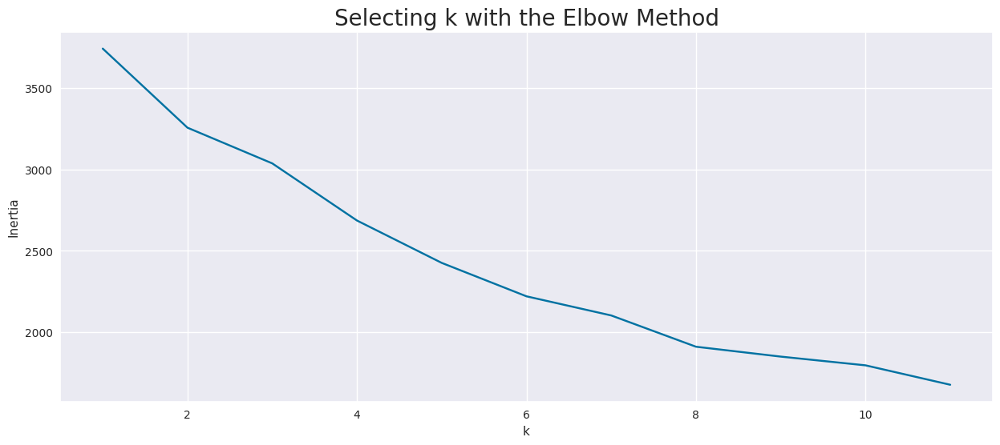

CPU times: user 205 ms, sys: 17.1 ms, total: 222 ms
Wall time: 250 ms


In [33]:
%%time
clusters = range(1, 12)
inertias = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(subset_std_scaled_df)

    inertias.append(model.inertia_)

    print("Number of Clusters:", k, "\tInertia:", model.inertia_)

plt.plot(clusters, inertias, "bx-")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

It is challenging to see a clear elbow here; however this graph suggests that 6 clusters is appropriate.

For n_clusters = 2, silhouette score is 0.45335782729503565
For n_clusters = 3, silhouette score is 0.40374060030338865
For n_clusters = 4, silhouette score is 0.4246430808437099
For n_clusters = 5, silhouette score is 0.4381539778147092
For n_clusters = 6, silhouette score is 0.40869599703024256
For n_clusters = 7, silhouette score is 0.1207450219233897
For n_clusters = 8, silhouette score is 0.3693991650696542
For n_clusters = 9, silhouette score is 0.35185096182499204
For n_clusters = 10, silhouette score is 0.32950073703610283
For n_clusters = 11, silhouette score is 0.1486586842527321


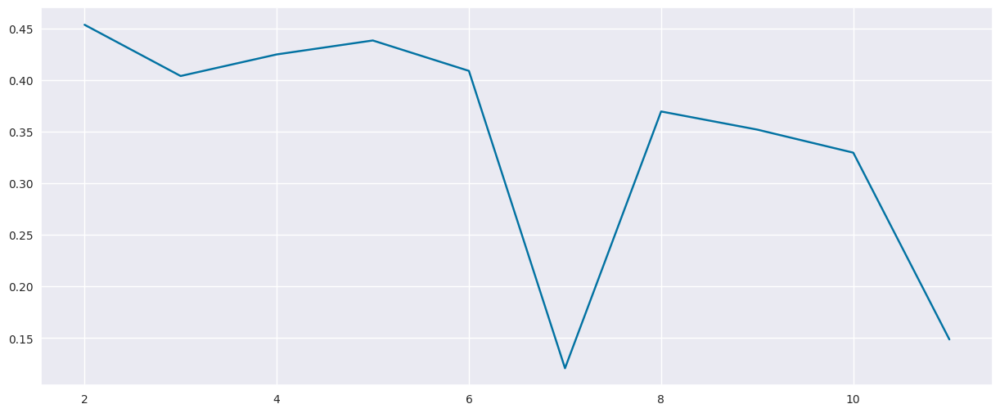

In [34]:
sil_score = []
cluster_list = list(range(2, 12))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict(subset_std_scaled_df)
    # centers = clusterer.cluster_centers_
    score = silhouette_score(subset_std_scaled_df, preds)
    sil_score.append(score)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

plt.plot(cluster_list, sil_score)

At 7, the silhouette score drops off precipitously.  The highest value is at 5, but the graph is relatively flat from 4 to 7.  Visually, 4 or 5 might be the optimal number of clusters.

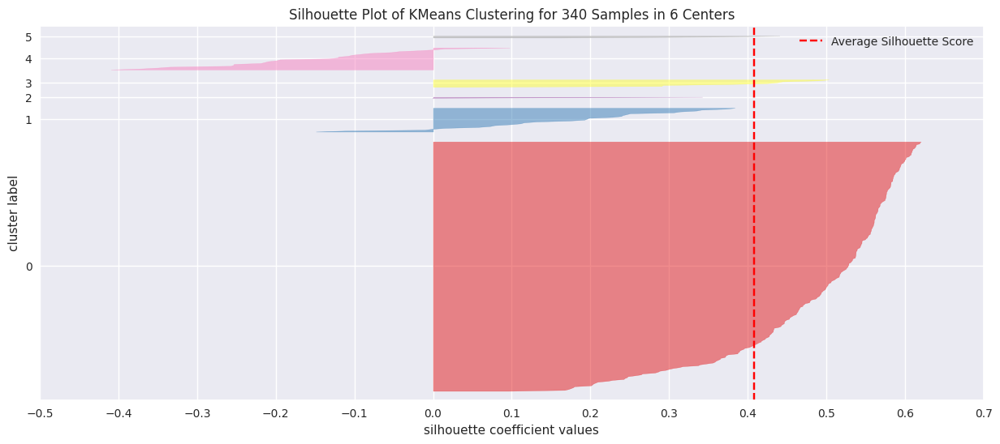

Average Silhouette Score: 0.40869599703024256


In [35]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(6, random_state=1))
visualizer.fit(subset_std_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

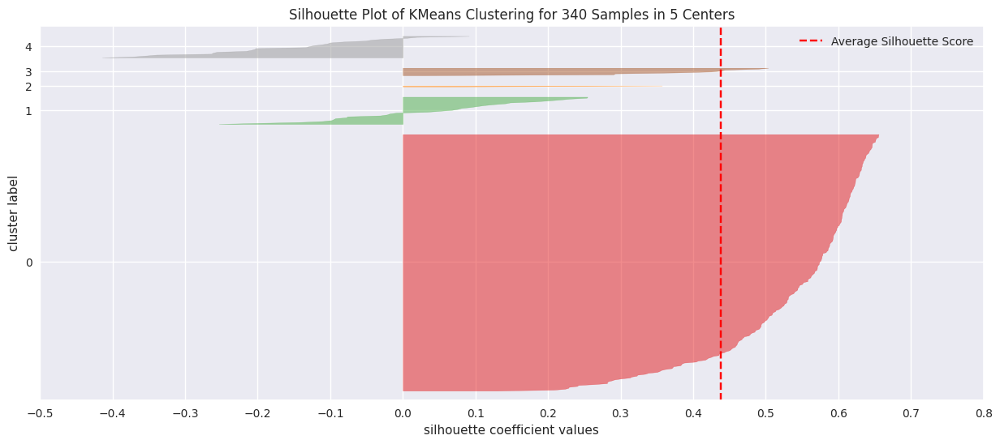

Average Silhouette Score: 0.4381539778147092


In [36]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(subset_std_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

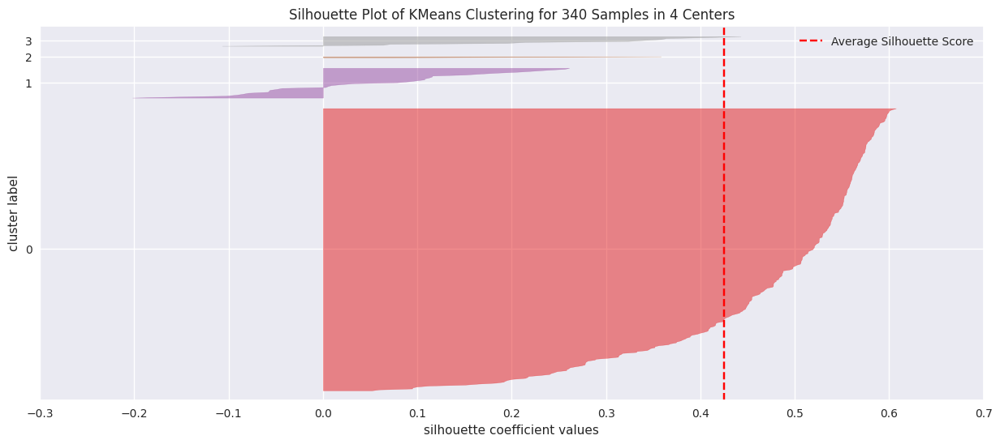

Average Silhouette Score: 0.4246430808437099


In [37]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(subset_std_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

Here K = 5 strikes the best balance for the data provided. However, this shows at least one group with a large negative score, suggesting misleading splits:

- **Highest Average Silhouette:** At K=5 the red dashed line sits highest (0.438), outperforming K=4 (0.425), and K=6 (0.409).

- **Well-Separated, Cohesive Clusters:** These clusters are not well separated, and only two exceed the average score.  

- **Avoids Overfitting & Tiny Clusters:** At all levels you see very small clusters with few samples (e.g. K=7) and some negative silhouettes, suggesting misleading splits rather than meaningful groupings.

###Robust Scaling

The poor clustering above may be due to the high number of outliers in the data set.  As a result, I am going to redo the k-means using the robust scaled data.

Number of Clusters: 1 	Inertia: 31126.80397985656
Number of Clusters: 2 	Inertia: 22348.18684630303
Number of Clusters: 3 	Inertia: 17760.24529385454
Number of Clusters: 4 	Inertia: 18211.316370911343
Number of Clusters: 5 	Inertia: 13860.290451292389
Number of Clusters: 6 	Inertia: 13130.81017518022
Number of Clusters: 7 	Inertia: 11576.265869796262
Number of Clusters: 8 	Inertia: 10722.940784738577
Number of Clusters: 9 	Inertia: 9231.44024821279
Number of Clusters: 10 	Inertia: 9039.188954396062
Number of Clusters: 11 	Inertia: 8146.759291863914


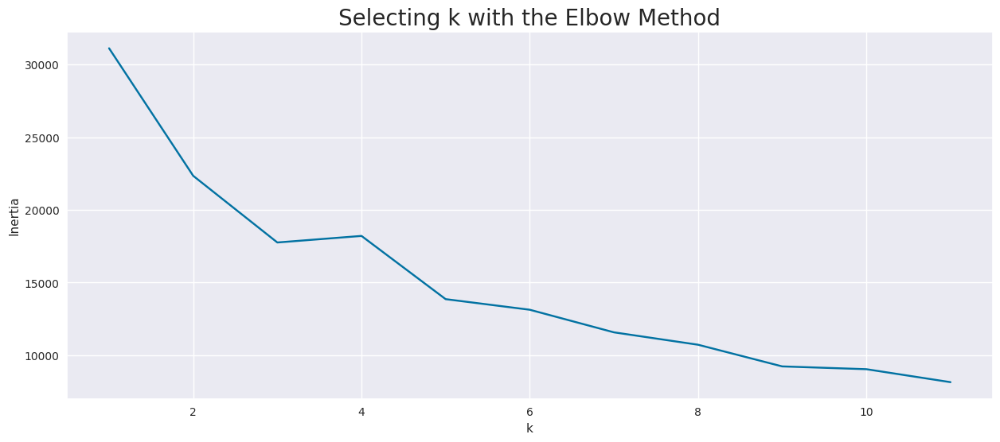

CPU times: user 197 ms, sys: 8 ms, total: 205 ms
Wall time: 205 ms


In [38]:
%%time
clusters = range(1, 12)
inertias = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(subset_robust_scaled_df)

    inertias.append(model.inertia_)

    print("Number of Clusters:", k, "\tInertia:", model.inertia_)

plt.plot(clusters, inertias, "bx-")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

There is a clear elbow at k=3 with a secondary elbow at k = 5.

For n_clusters = 2, silhouette score is 0.7757324276239033
For n_clusters = 3, silhouette score is 0.7454764840420494
For n_clusters = 4, silhouette score is 0.4621955535259713
For n_clusters = 5, silhouette score is 0.4829025199901958
For n_clusters = 6, silhouette score is 0.4813819928027789
For n_clusters = 7, silhouette score is 0.49576783422468745
For n_clusters = 8, silhouette score is 0.411864134740954
For n_clusters = 9, silhouette score is 0.4012633404812339
For n_clusters = 10, silhouette score is 0.3763626634759577
For n_clusters = 11, silhouette score is 0.3505016857108297


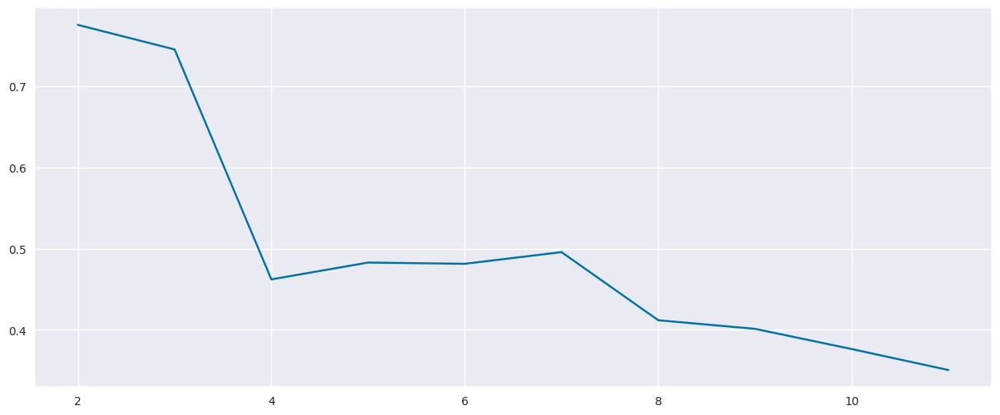

In [39]:
sil_score = []
cluster_list = list(range(2, 12))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict(subset_robust_scaled_df)
    # centers = clusterer.cluster_centers_
    score = silhouette_score(subset_robust_scaled_df, preds)
    sil_score.append(score)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

plt.plot(cluster_list, sil_score)

The silhouette score has a strong peak at k = 3, suggesting that this may be the ideal clustering.  I will check the graphs for k = 3 through k = 5

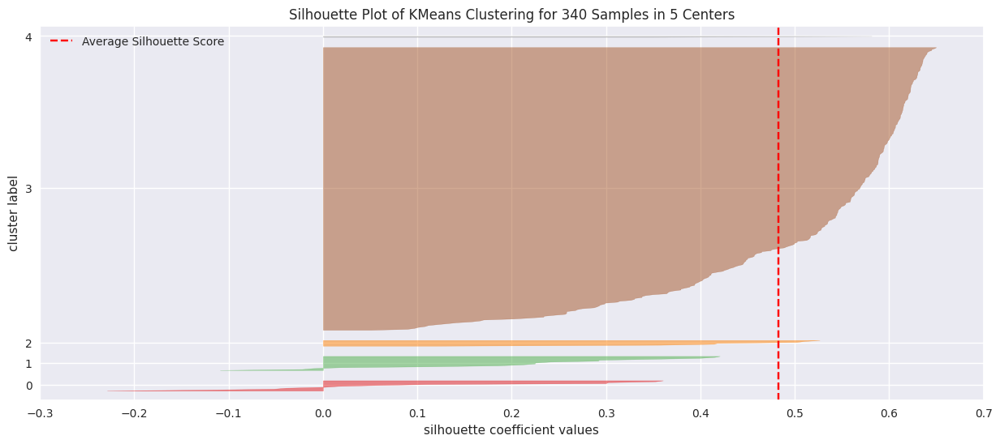

Average Silhouette Score: 0.4829025199901958


In [40]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(subset_robust_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

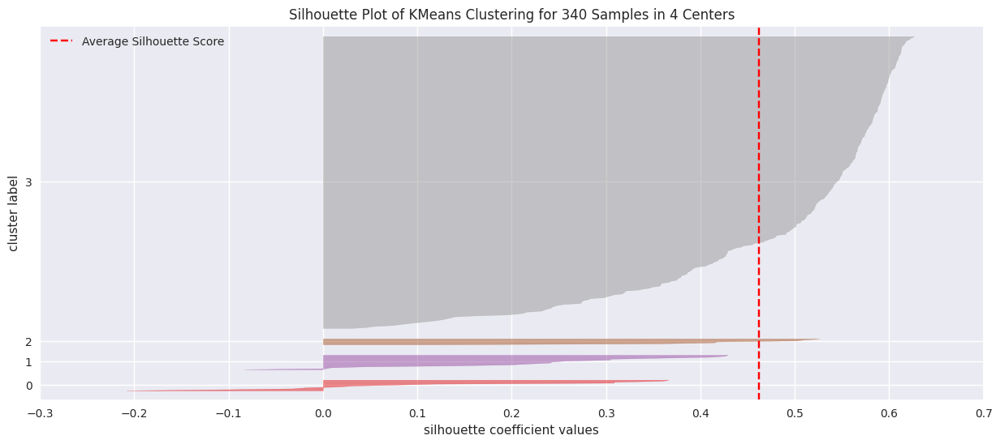

Average Silhouette Score: 0.4621955535259713


In [41]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(subset_robust_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

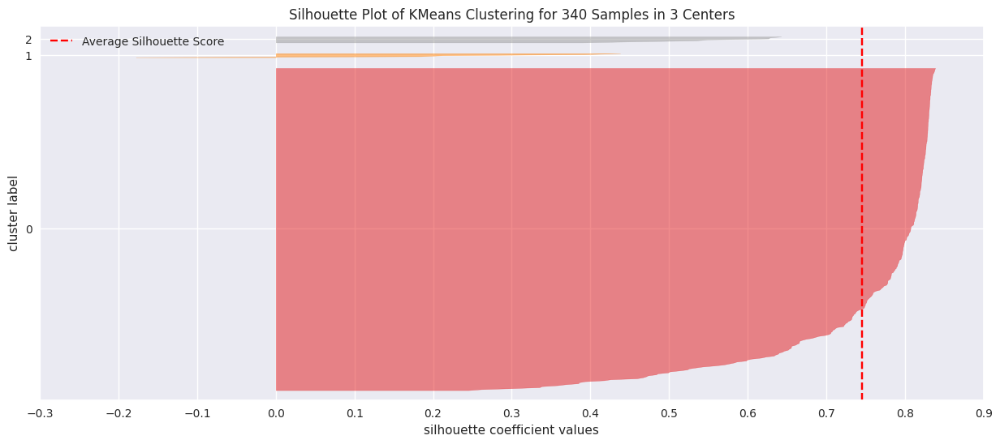

Average Silhouette Score: 0.7454764840420494


In [42]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(subset_robust_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

With the robust scaled data K = 3 appears to be the best value for the data provided. However, this clustering is still problematic:

- **Highest Average Silhouette:** At K=3 the red dashed line sits highest (0.745), outperforming K=4 (0.462), and K=5 (0.483).

- **Well-Separated, Cohesive Clusters:** These clusters are not well separated, with the vast majority of the dataset belonging to a single cluster.  

- **Avoids Overfitting & Tiny Clusters:** At all levels you see very small clusters with few samples.  Even with our chosen value of k=3, there is one cluster with a negative silhouette, suggesting misleading splits rather than meaningful groupings.  Additionally, the large number of stocks in cluster 0 are indicative of a poor model.

###Final K-Means Model
The final model I am selecting is based on the Robustly scaled data with k = 3.  However, I am not convinced this will show meaningful clusters.

In [43]:
final_kmeans_model = KMeans(n_clusters=3, random_state=0)

# fit the model
final_kmeans_model.fit(subset_robust_scaled_df)

# add cluster labels to the dataframe
data["K_means_segments"] = final_kmeans_model.labels_


###K-Means Cluster Profiling

In [44]:
# Dropping the categorical column before proceeding with cluster profiling using means
cluster_profile = data.groupby("K_means_segments").mean(numeric_only = True).round(2)

cluster_profile["count_in_each_segment"] = (
    data.groupby("K_means_segments")["GICS Sector"].count().values
)

In [45]:
# let's display cluster profiles
cluster_profile.style.format('{:.2f}').highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,count_in_each_segment
K_means_segments,,,,,,,,,,,,
0,81.83,4.03,1.53,27.10,70.78,223632270.19,1295900201.86,3.10,489058144.59,32.60,-1.34,322.00
1,84.36,3.85,1.83,633.57,33.57,-568400000.00,-4968157142.86,-10.84,398169036.44,42.28,-11.59,7.00
2,50.23,5.52,1.27,27.36,71.09,-4468000000.00,11417090909.09,2.11,3265975365.68,26.84,-6.42,11.00


In [46]:
# Dropping the categorical column before proceeding with cluster profiling using medians
cluster_profile = data.groupby("K_means_segments").median(numeric_only = True).round(2)

cluster_profile["count_in_each_segment"] = (
    data.groupby("K_means_segments")["GICS Sector"].count().values
)

In [47]:
# let's display cluster profiles
cluster_profile.style.format('{:.2f}').highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,count_in_each_segment
K_means_segments,,,,,,,,,,,,
0,59.83,4.20,1.39,15.00,47.00,5666000.00,689522500.00,2.96,294816221.55,20.82,-0.94,322.00
1,66.62,11.40,1.28,596.00,27.00,-119000000.00,153900000.00,1.53,364388489.20,41.20,-1.84,7.00
2,48.58,6.28,1.26,12.00,53.00,-3857000000.00,13345000000.00,3.85,4040000000.00,14.52,-1.89,11.00


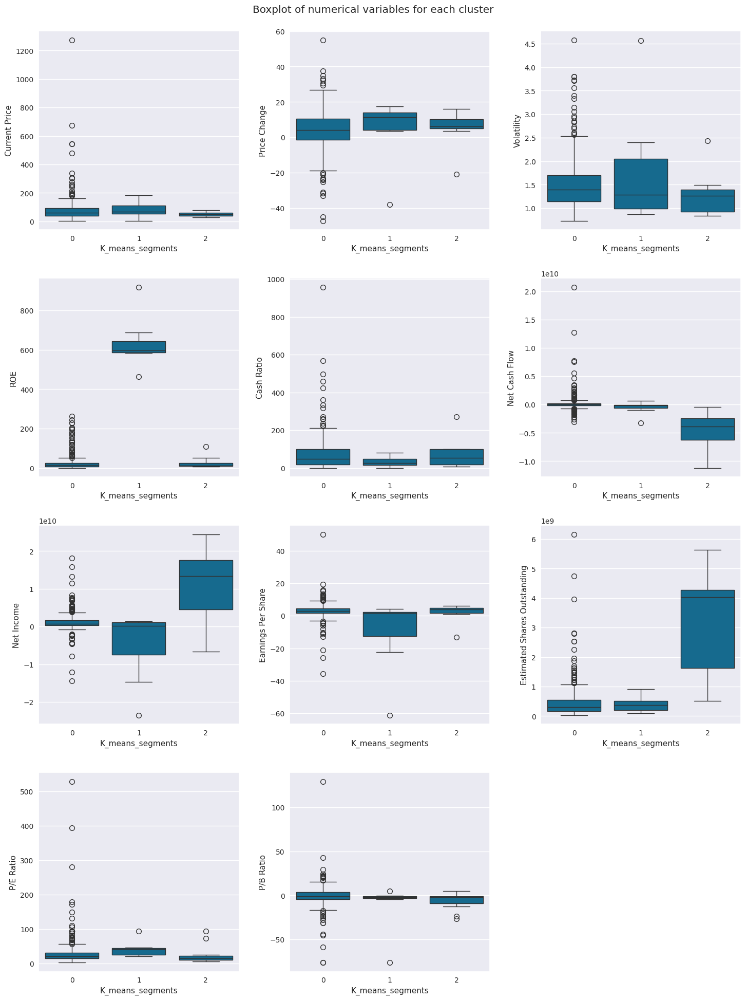

In [48]:
plt.figure(figsize=(15, 20))
plt.suptitle("Boxplot of numerical variables for each cluster")

for i, variable in enumerate(numerical_cols):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(data=data, x="K_means_segments", y=variable)

plt.tight_layout(pad=2.0)

In [49]:
## Complete the code to print the companies in each cluster
for cl in data["K_means_segments"].unique():
    print("In cluster {}, the following companies are present:".format(cl))
    print(data[data["K_means_segments"] == cl]["Security"].unique())
    print()

In cluster 0, the following companies are present:
['American Airlines Group' 'AbbVie' 'Abbott Laboratories'
 'Adobe Systems Inc' 'Analog Devices, Inc.' 'Archer-Daniels-Midland Co'
 'Alliance Data Systems' 'Ameren Corp' 'American Electric Power'
 'AFLAC Inc' 'American International Group, Inc.'
 'Apartment Investment & Mgmt' 'Assurant Inc' 'Arthur J. Gallagher & Co.'
 'Akamai Technologies Inc' 'Albemarle Corp' 'Alaska Air Group Inc'
 'Allstate Corp' 'Alexion Pharmaceuticals' 'Applied Materials Inc'
 'AMETEK Inc' 'Affiliated Managers Group Inc' 'Amgen Inc'
 'Ameriprise Financial' 'American Tower Corp A' 'Amazon.com Inc'
 'AutoNation Inc' 'Anthem Inc.' 'Aon plc' 'Amphenol Corp' 'Arconic Inc'
 'Activision Blizzard' 'AvalonBay Communities, Inc.' 'Broadcom'
 'American Water Works Company Inc' 'American Express Co' 'Boeing Company'
 'Bank of America Corp' 'Baxter International Inc.' 'BB&T Corporation'
 'Bard (C.R.) Inc.' 'Baker Hughes Inc' 'BIOGEN IDEC Inc.'
 'The Bank of New York Mellon Cor

In [50]:
## Complete the code to print the segments in each cluster
for seg in data["K_means_segments"].unique():
    print("In cluster {}, the following segments are present:".format(seg))
    print(data[data["K_means_segments"] == seg]["GICS Sector"].unique())
    print()

In cluster 0, the following segments are present:
['Industrials' 'Health Care' 'Information Technology' 'Consumer Staples'
 'Utilities' 'Financials' 'Real Estate' 'Materials'
 'Consumer Discretionary' 'Energy' 'Telecommunications Services']

In cluster 1, the following segments are present:
['Industrials' 'Energy' 'Consumer Discretionary' 'Consumer Staples'
 'Financials']

In cluster 2, the following segments are present:
['Energy' 'Health Care' 'Financials' 'Information Technology'
 'Consumer Discretionary' 'Consumer Staples' 'Telecommunications Services']



###Insights and Observations


**Cluster 0**
- This is the "catch all" cluster that has the vast majority of stocks in it (n=322).  This cluster has the highest median volatility, Net Cash Flow, and P/B ratio.  This cluster has the higest mean Earnings Per Share.  This cluster has the lowest median Price Change and Estimated Shares Outstanding.  This cluster has the lowest mean ROE.  Overall, these seem to be fairly stable stocks that might be considered a "safe" investment.

**Cluster 1**
- This cluster has 7 stocks in it.  This is marked by the highest median Current Price, Price Change, ROE, and P/E ratio.  This cluster has the lowest median Cash Ratio, Net Income, and Earnings Per Share. These values suggest a "good buy" for confident investors.  

**Cluster 2**
- This cluster has 11 stocks in it.  This is marked by the highest median Cash Ratio, Net Income, Earnings per Share, and Estimated Stocks Outstanding.  It has the lowest median Current Price, Volatility, ROE, Net Cash Flow, P/E ratio and P/B ratio.  These appear to be solid companies who have possibly overextended themselves due to the high negative cash flow and the low P/E ratio.  These stocks may be undervalued, so investors might get getting a good deal. However, they should be cautious.

## Hierarchical Clustering

In [51]:
hc_std_scaled_df = subset_std_scaled_df.copy()
hc_robust_scaled_df = subset_robust_scaled_df.copy()

###Cophenetic Correlation - Standard Scaling

In [52]:
%%time
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(hc_std_scaled_df, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(hc_std_scaled_df))
        print("Cophenetic correlation for {} distance and {} linkage is {}.".format(dm.capitalize(), lm, c)
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.9232271494002922.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7873280186580672.
Cophenetic correlation for Euclidean distance and average linkage is 0.9422540609560814.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.8693784298129404.
Cophenetic correlation for Chebyshev distance and single linkage is 0.9062538164750717.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.598891419111242.
Cophenetic correlation for Chebyshev distance and average linkage is 0.9338265528030499.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.9127355892367.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.925919553052459.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.7925307202850002.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.9247324030159736.
Cophenetic correla

In [53]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9422540609560814, which is obtained with Euclidean distance and average linkage.


In [54]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(hc_std_scaled_df, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(hc_std_scaled_df))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

Cophenetic correlation for single linkage is 0.9232271494002922.
Cophenetic correlation for complete linkage is 0.7873280186580672.
Cophenetic correlation for average linkage is 0.9422540609560814.
Cophenetic correlation for centroid linkage is 0.9314012446828154.
Cophenetic correlation for ward linkage is 0.7101180299865353.
Cophenetic correlation for weighted linkage is 0.8693784298129404.


In [55]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9422540609560814, which is obtained with average linkage.


CPU times: user 3.09 s, sys: 3.93 ms, total: 3.09 s
Wall time: 3.16 s


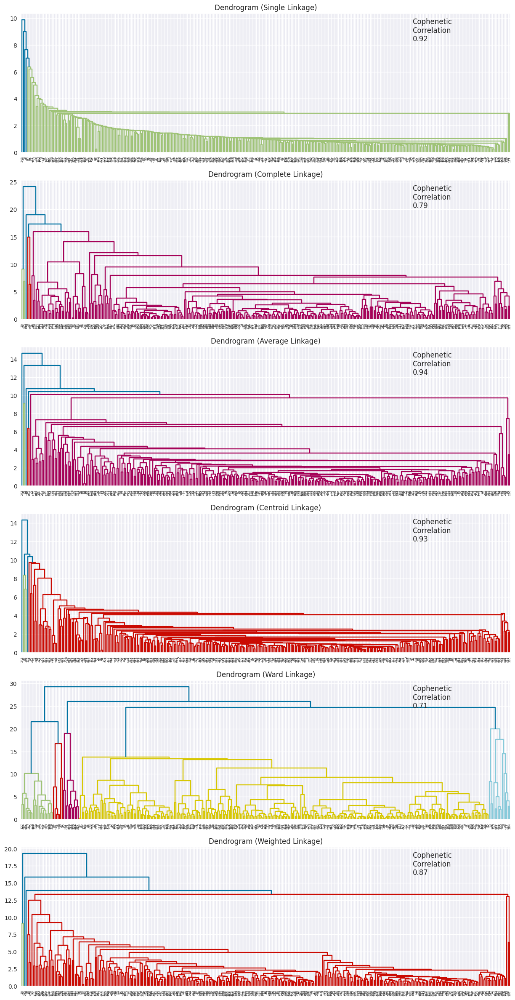

In [56]:
%%time
# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(hc_std_scaled_df, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(hc_std_scaled_df))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

####Observations
Using the standard scaled data, average linking still appears best based on the dendrograms.  It appears that 6 clusters is best, but we still have the issue we had with K-means.  There will be one very large cluster with many smaller ones.  Before proceeding, we will look at hiearchical clustering with the Robust Scaled Data.

###Cophenetic Correlation with Robust Scaled Data

In [57]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(hc_robust_scaled_df, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(hc_robust_scaled_df))
        print("Cophenetic correlation for {} distance and {} linkage is {}.".format(dm.capitalize(), lm, c)
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.9512204406607533.
Cophenetic correlation for Euclidean distance and complete linkage is 0.8960592918913967.
Cophenetic correlation for Euclidean distance and average linkage is 0.9447261138479435.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.8775147561618539.
Cophenetic correlation for Chebyshev distance and single linkage is 0.944364487459596.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.8852745068225082.
Cophenetic correlation for Chebyshev distance and average linkage is 0.9380433232482484.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.8839021194082463.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.8278760413864898.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.6543691119432388.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.8063248531078827.
Cophenetic cor

In [58]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9512204406607533, which is obtained with Euclidean distance and single linkage.


In [59]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(hc_robust_scaled_df, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(hc_robust_scaled_df))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

Cophenetic correlation for single linkage is 0.9512204406607533.
Cophenetic correlation for complete linkage is 0.8960592918913967.
Cophenetic correlation for average linkage is 0.9447261138479435.
Cophenetic correlation for centroid linkage is 0.94579287822445.
Cophenetic correlation for ward linkage is 0.81644582343159.
Cophenetic correlation for weighted linkage is 0.8775147561618539.


In [60]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9512204406607533, which is obtained with single linkage.


###Dendrograms

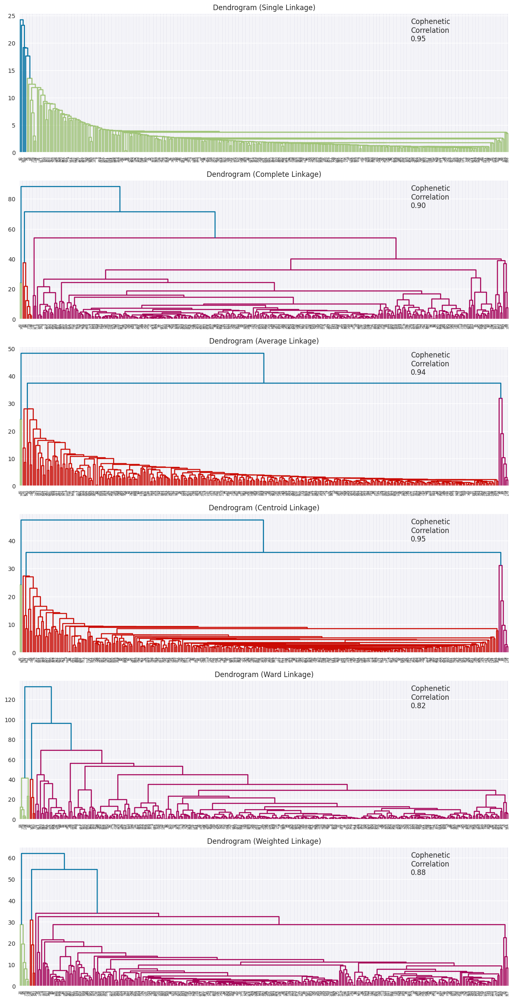

In [61]:
# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(hc_robust_scaled_df, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(hc_robust_scaled_df))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

####Observations

The best balance between decent dendrogram groupings and high cophenetic correlation appears to be Euclidean distance with Complete linkage.  Since complete linkage is less sensitive to outliers to single linkage, the clusters are more spread out despite having a lower cophenetic correlation.  It appears that five clusters are best here.

###Final Hierarchical Clustering Model

In [62]:
HCmodel = AgglomerativeClustering(n_clusters=5, metric="euclidean", linkage="complete")
HCmodel.fit(hc_robust_scaled_df)

AgglomerativeClustering(linkage='complete', n_clusters=5)

In [63]:
subset_robust_scaled_df["HC_Clusters"] = HCmodel.labels_
data["HC_Clusters"] = HCmodel.labels_

###HC Data Profiling

In [64]:
hc_rob_df = data.copy()
hc_rob_scaled_df = subset_robust_scaled_df.copy()

hc_rob_df.drop("K_means_segments", axis = 1, inplace = True)

In [65]:
hc_cluster_profile = hc_rob_df.groupby("HC_Clusters").mean(numeric_only=True)
hc_cluster_profile["count_in_each_segments"] = (
    hc_rob_df.groupby("HC_Clusters")["GICS Sector"].count().values
)

#  display cluster profiles
hc_cluster_profile.style.format('{:.2f}').highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,count_in_each_segments
HC_Clusters,,,,,,,,,,,,
0,253.73,6.77,1.72,16.20,118.00,3287293600.00,2034910100.00,6.67,795977213.86,141.41,0.14,10.00
1,75.94,3.93,1.52,27.40,68.93,-59262091.19,1369961522.01,2.93,530031434.75,29.31,-1.50,318.00
2,84.36,3.85,1.83,633.57,33.57,-568400000.00,-4968157142.86,-10.84,398169036.44,42.28,-11.59,7.00
3,54.67,6.34,1.08,42.33,70.67,-8225666666.67,19854333333.33,5.28,3769674822.67,10.34,-9.81,3.00
4,25.64,11.24,1.32,12.50,130.50,16755500000.00,13654000000.00,3.29,2791829362.10,13.65,1.51,2.00


In [66]:
hc_cluster_profile = hc_rob_df.groupby("HC_Clusters").median(numeric_only=True)
hc_cluster_profile["count_in_each_segments"] = (
    hc_rob_df.groupby("HC_Clusters")["GICS Sector"].count().values
)

#  display cluster profiles
hc_cluster_profile.style.format('{:.2f}').highlight_max(color="lightgreen", axis=0).highlight_min(color="pink", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,count_in_each_segments
HC_Clusters,,,,,,,,,,,,
0,93.23,4.49,1.41,8.00,70.50,3454500000.00,1621400000.00,1.83,444262500.00,25.38,1.43,10.00
1,59.45,4.29,1.39,15.00,45.00,813000.00,694512000.00,2.97,298361299.45,20.82,-1.03,318.00
2,66.62,11.40,1.28,596.00,27.00,-119000000.00,153900000.00,1.53,364388489.20,41.20,-1.84,7.00
3,51.75,6.28,1.13,10.00,99.00,-7341000000.00,17879000000.00,5.41,4040000000.00,10.55,-1.89,3.00
4,25.64,11.24,1.32,12.50,130.50,16755500000.00,13654000000.00,3.29,2791829362.10,13.65,1.51,2.00


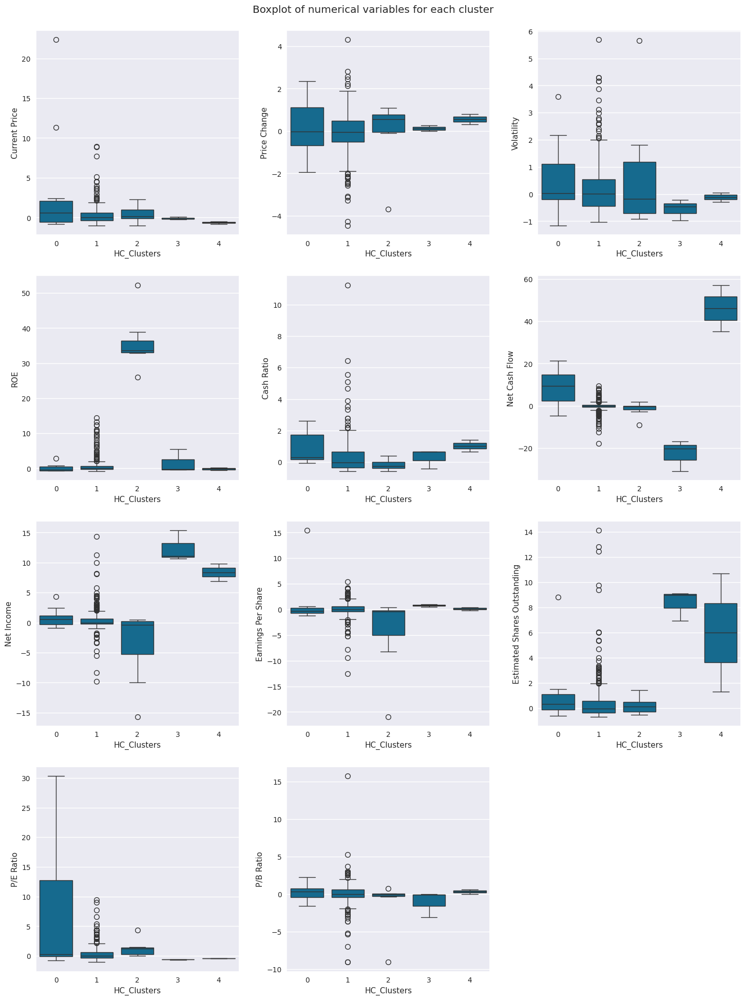

In [67]:
plt.figure(figsize=(15, 20))
plt.suptitle("Boxplot of numerical variables for each cluster")

for i, variable in enumerate(numerical_cols):
    plt.subplot(4, 3, i + 1)
    sns.boxplot(data=hc_rob_scaled_df, x="HC_Clusters", y=variable)

plt.tight_layout(pad=2.0)

In [68]:
## Complete the code to print the companies in each cluster
for cl in data["HC_Clusters"].unique():
    print("In cluster {}, the following companies are present:".format(cl))
    print(data[data["HC_Clusters"] == cl]["Security"].unique())
    print()

In cluster 1, the following companies are present:
['American Airlines Group' 'AbbVie' 'Abbott Laboratories'
 'Adobe Systems Inc' 'Analog Devices, Inc.' 'Archer-Daniels-Midland Co'
 'Alliance Data Systems' 'Ameren Corp' 'American Electric Power'
 'AFLAC Inc' 'American International Group, Inc.'
 'Apartment Investment & Mgmt' 'Assurant Inc' 'Arthur J. Gallagher & Co.'
 'Akamai Technologies Inc' 'Albemarle Corp' 'Alaska Air Group Inc'
 'Allstate Corp' 'Applied Materials Inc' 'AMETEK Inc'
 'Affiliated Managers Group Inc' 'Amgen Inc' 'Ameriprise Financial'
 'American Tower Corp A' 'AutoNation Inc' 'Anthem Inc.' 'Aon plc'
 'Anadarko Petroleum Corp' 'Amphenol Corp' 'Arconic Inc'
 'Activision Blizzard' 'AvalonBay Communities, Inc.' 'Broadcom'
 'American Water Works Company Inc' 'American Express Co' 'Boeing Company'
 'Baxter International Inc.' 'BB&T Corporation' 'Bard (C.R.) Inc.'
 'Baker Hughes Inc' 'BIOGEN IDEC Inc.' 'The Bank of New York Mellon Corp.'
 'Ball Corp' 'Bristol-Myers Squibb' '

In [69]:
## Print the GICS Sectors in each cluster
for cl in data["HC_Clusters"].unique():
    print("In cluster {}, the following GICS Sectors are present:".format(cl))
    print(data[data["HC_Clusters"] == cl]["GICS Sector"].unique())
    print()

In cluster 1, the following GICS Sectors are present:
['Industrials' 'Health Care' 'Information Technology' 'Consumer Staples'
 'Utilities' 'Financials' 'Real Estate' 'Materials'
 'Consumer Discretionary' 'Energy' 'Telecommunications Services']

In cluster 2, the following GICS Sectors are present:
['Industrials' 'Energy' 'Consumer Discretionary' 'Consumer Staples'
 'Financials']

In cluster 0, the following GICS Sectors are present:
['Health Care' 'Consumer Discretionary' 'Utilities' 'Energy'
 'Information Technology' 'Financials']

In cluster 4, the following GICS Sectors are present:
['Financials' 'Information Technology']

In cluster 3, the following GICS Sectors are present:
['Financials' 'Telecommunications Services']



###Insights and Observations
**Cluster 0**
- This cluster has 10 companies with the highest median Current Price and volatility.  These have the lowest median ROE.  This suggest this cluster has stocks that are viewedd as "popular" but objectively may carry risk.

**Cluster 1**
- As with K-means, this is the "catch all" cluster, with 318 observations from all GICS sectors.This cluster is marked by the lowest median price change and lowest Estimated shares outstanding.

**Cluster 2**
- This cluster has 7 companies in it.  This companies have the highest median price change, ROE, and P/E ratio.  They have the lowest median cash ratio, net income, and earnings per share.  While these companies seem cash poor, they also appear to be solid investments with strong earnings potential.

**Cluster 3**
- This cluster has 3 companies in it.  This cluster has the highest median net income, earnings per share, and estimated shares outstanding.  These companies have the lowest median volatility, net income, P/E ratio, and P/B ratio.  These companies look like the most conservative purchase option since they appear to draw in much capital while keeping low volatility.  The low P/E ratio suggests they are either undervalued or are not sought after by many investors.

**Cluster 4**
- This cluster has 2 companies in it.These companies have the highest cash ratio and net cash flow and the lowest current price.  These companies may also be a conservative option for investors new to the market.  The companies high debt to income ratio coupled with their low stock price suggests that the company is stable but also affordable for newer investors.

## K-means vs Hierarchical Clustering

You compare several things, like:
- Which clustering technique took less time for execution?
- Which clustering technique gave you more distinct clusters, or are they the same?
- How many observations are there in the similar clusters of both algorithms?
- How many clusters are obtained as the appropriate number of clusters from both algorithms?

You can also mention any differences or similarities you obtained in the cluster profiles from both the clustering techniques.

In [70]:
pd.crosstab(data["K_means_segments"], data["HC_Clusters"])

HC_Clusters,0,1,2,3,4
K_means_segments,,,,,
0,10,310,0,0,2
1,0,0,7,0,0
2,0,8,0,3,0


###Observations
There is significant overlap between the k-means and the hiearchical clustering.  For the size of the data set, time running the code was not an issue.  Both techniques were near instaneous from the user point of view.  

K-means and hierarchical clustering produced similar (though not identical) results.  The one group that is identical in both approaches is the k-means cluster 1 and the HC cluster 2.  These two methods identified the same seven companies as solid investments.  The two approaches differed in how they handled the noise of the data set.  Of the 322 items in k-means cluster 0, most were also classified in cluster 1, the generic "catch all" clusters.  However, hierarchical clusters separated out 10 that were distinct from the mass in their own cluster (HC cluster 0).  Of the 318 items in the catch all HC cluster 1, K-means separated out 8 and grouped them with HC cluster 3 to form K-means cluster 2.  Both methods of clustering identified low P/E and low cash resources for these companies.  Overall, the hierarchical clustering appears to be clearer with better defineable distinctions between the two groups.

##Principal Component Analysis (PCA)

In [71]:
# setting the number of components to 2
pca = PCA(n_components=2)

# transforming data and storing results in a dataframe
X_reduced_pca = pca.fit_transform(hc_robust_scaled_df)
reduced_df_pca = pd.DataFrame(
    data=X_reduced_pca, columns=["Component 1", "Component 2"]
)

In [72]:
# checking the amount of variance explained
pca.explained_variance_ratio_.sum()

np.float64(0.6731793887113793)

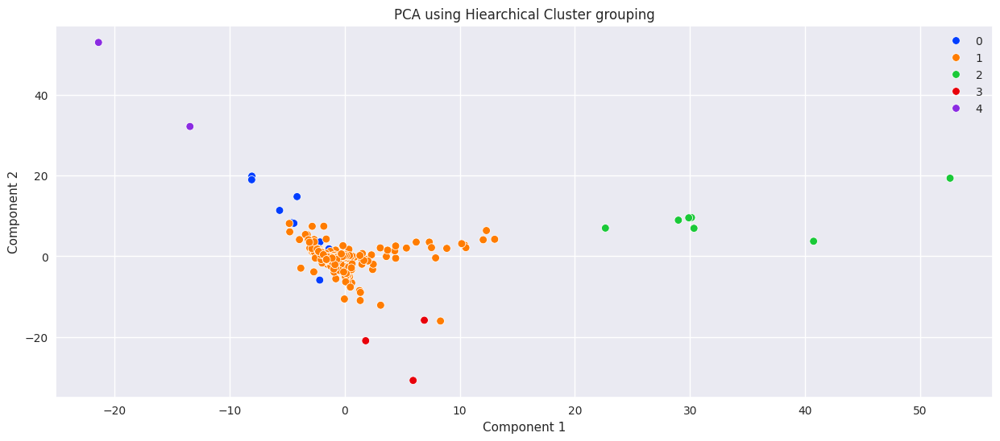

In [73]:
# Visualizing the Hierarchical Clustering
sns.scatterplot(
    data=reduced_df_pca,
    x="Component 1",
    y="Component 2",
    hue=data["HC_Clusters"],
    palette="bright",
)
plt.legend(bbox_to_anchor=(1, 1))
plt.title("PCA using Hiearchical Cluster grouping")
plt.show()

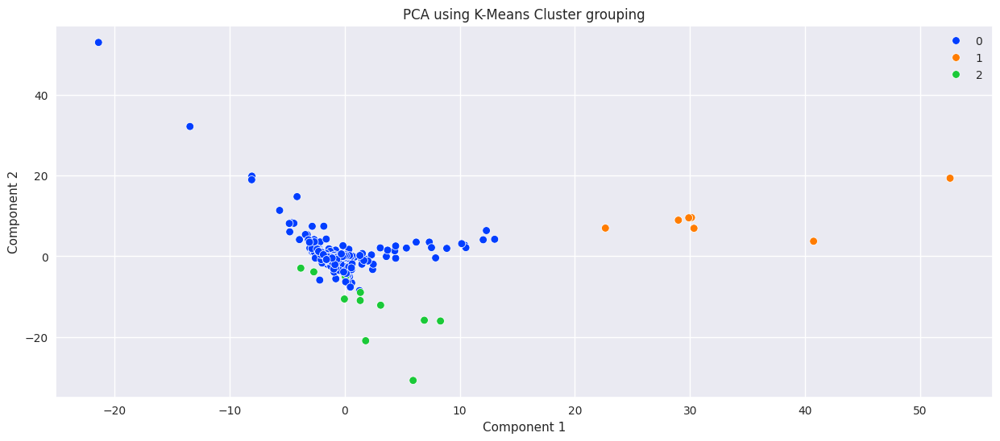

In [74]:
# Visualizing the K-means clustering
sns.scatterplot(
    data=reduced_df_pca,
    x="Component 1",
    y="Component 2",
    hue=data["K_means_segments"],
    palette="bright",
)
plt.legend(bbox_to_anchor=(1, 1))
plt.title("PCA using K-Means Cluster grouping")
plt.show()

###Observations on PCA

As seen above, reducing the dimensionality of the clusterings to two dimensions captures 67.32% of the variation in the data set.  Both methods of clustering did a good job at isolating the cluster on the far right.  Hierarchical clustering further distinguished outliers along the 2nd component axis that were not delineated by K-means.  However, it appears that K-means did a better job of clustering values below zero on the second component than did hiearchical clustering.

##Catch All Group analysis

In order to better provide support for the client, I will be dropping all original HC clusters other than the stocks that belonged to both K-means cluster 0 and HC Cluster 1.  This will allow me to see if removing these outliers (according to PCA) will result in better clustering of the data.  I will only use Robust Scaling rather for this follow up analysis rather than both robust and standard scaling.

In [75]:
#copy data and create a subset of just HC_cluster 1
data_hc1 = data.copy()
data_hc1 = data_hc1[(data_hc1["HC_Clusters"] == 1) & (data_hc1["K_means_segments"] == 0)]

#drop K_means_segments and HC_Clusters columns
data_hc1.drop(["K_means_segments", "HC_Clusters"], axis = 1, inplace = True)

#reset indices
data_hc1.reset_index(drop = True, inplace = True)
data_hc1.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.35,10.00,1.69,135,51,-604000000,7610000000,11.39,668129938.50,3.72,-8.78
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.24,8.34,2.20,130,77,51000000,5144000000,3.15,1633015873.00,18.81,-8.75
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.91,11.30,1.27,21,67,938000000,4423000000,2.94,1504421769.00,15.28,-0.39
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.94,13.98,1.36,9,180,-240840000,629551000,1.26,499643650.80,74.56,4.20
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.32,-1.83,1.70,14,272,315120000,696878000,0.31,2247993548.00,178.45,1.06


In [76]:
data_hc1.shape

(310, 15)

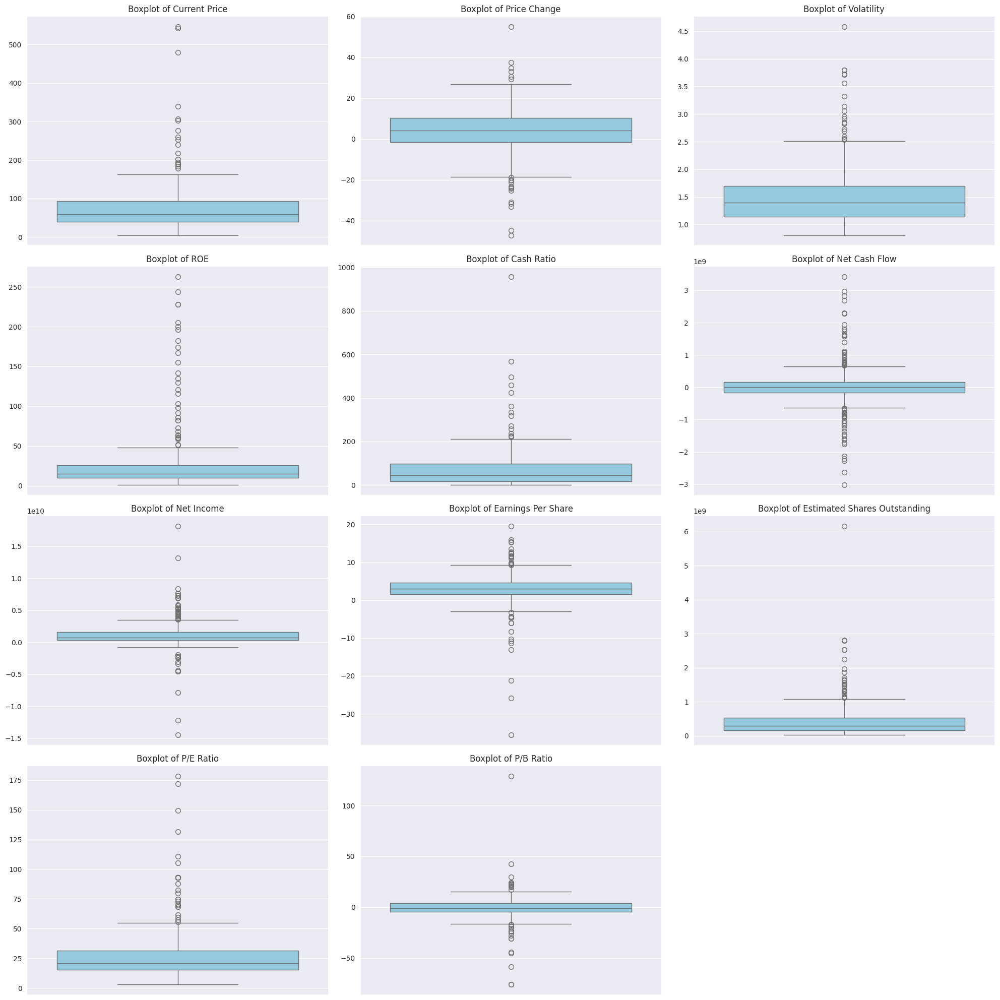

In [77]:
#a grid of boxplots for all numerical variables in the data dataframe

# Identify numerical columns
numerical_cols = data_hc1.select_dtypes(include=np.number).columns.tolist()

# Create a figure and a set of subplots with 4 rows and 3 columns
fig, axes = plt.subplots(4, 3, figsize=(20, 20))
axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

# Loop through each numerical column and create a boxplot
for i, col in enumerate(numerical_cols):
    if i < len(axes): # Ensure we don't go out of bounds if there are more columns than subplots
        sns.boxplot(y=data_hc1[col], ax=axes[i], color='skyblue')
        axes[i].set_title(f'Boxplot of {col}', fontsize=12)
        axes[i].set_ylabel('') # Remove y-label to avoid clutter

# Hide any unused subplots
for j in range(len(numerical_cols), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout() # Adjust layout to prevent overlapping titles/labels
plt.show()

In [78]:
subset = data_hc1[numerical_cols].copy()
std_scaled = robust_scaler.fit_transform(subset)
data_hc1_scaled_df = pd.DataFrame(std_scaled, columns=subset.columns)

###K-means on cluster 1

Number of Clusters: 1 	Inertia: 9395.306816940747
Number of Clusters: 2 	Inertia: 7760.2873272551
Number of Clusters: 3 	Inertia: 6700.712581772622
Number of Clusters: 4 	Inertia: 6248.493294039234
Number of Clusters: 5 	Inertia: 5544.031198307488
Number of Clusters: 6 	Inertia: 5101.922197033679
Number of Clusters: 7 	Inertia: 4863.056667990413
Number of Clusters: 8 	Inertia: 4653.5884021413785


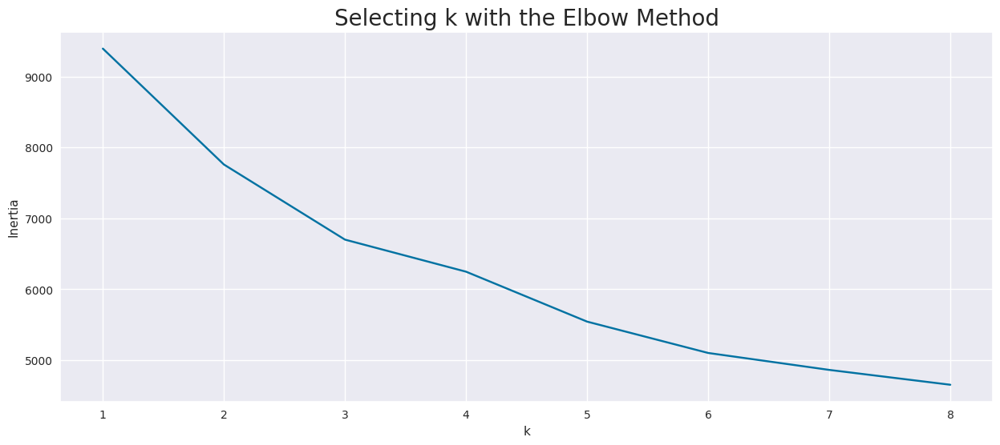

In [79]:
clusters = range(1, 9)
inertias = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(data_hc1_scaled_df)

    inertias.append(model.inertia_)

    print("Number of Clusters:", k, "\tInertia:", model.inertia_)

plt.plot(clusters, inertias, "bx-")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

There is a clear elbow at the 5 cluster mark.

For n_clusters = 2, silhouette score is 0.5280281917752806
For n_clusters = 3, silhouette score is 0.34468391323129605
For n_clusters = 4, silhouette score is 0.3366612425043029
For n_clusters = 5, silhouette score is 0.3573442642551835
For n_clusters = 6, silhouette score is 0.30624715297454713
For n_clusters = 7, silhouette score is 0.3202580258110962
For n_clusters = 8, silhouette score is 0.25311537646520643


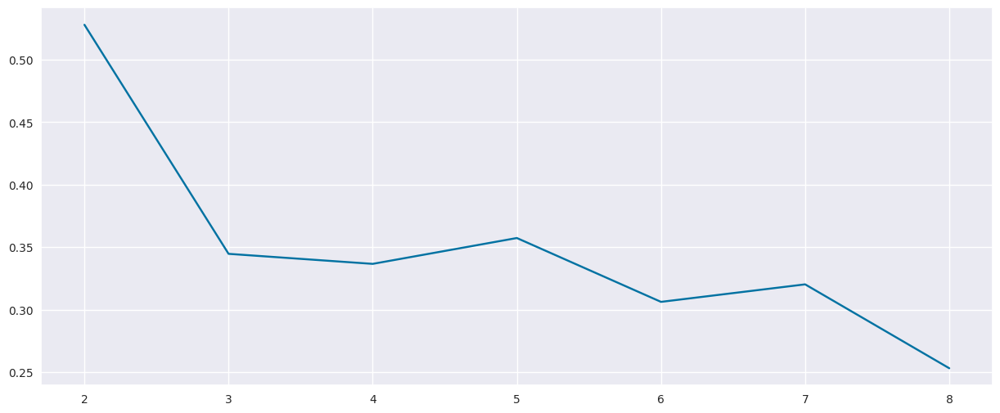

In [80]:
sil_score = []
cluster_list = list(range(2, 9))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict(data_hc1_scaled_df)
    # centers = clusterer.cluster_centers_
    score = silhouette_score(data_hc1_scaled_df, preds)
    sil_score.append(score)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

plt.plot(cluster_list, sil_score)

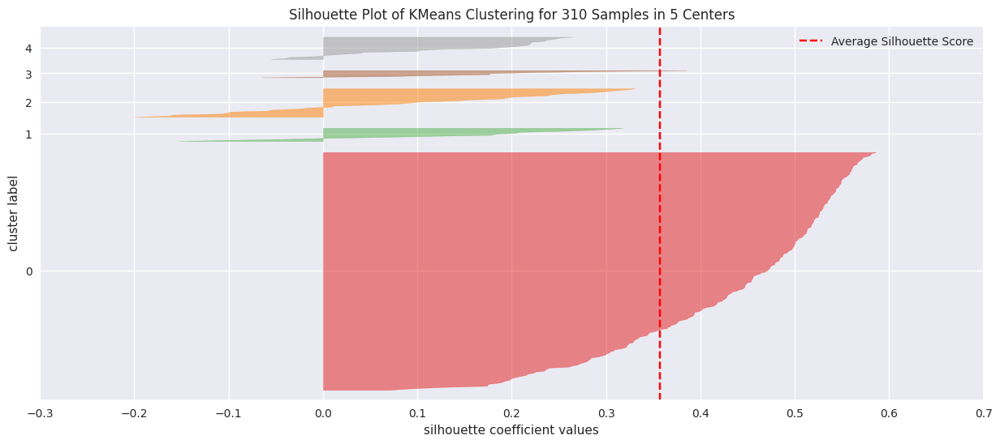

Average Silhouette Score: 0.3573442642551835


In [81]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(data_hc1_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

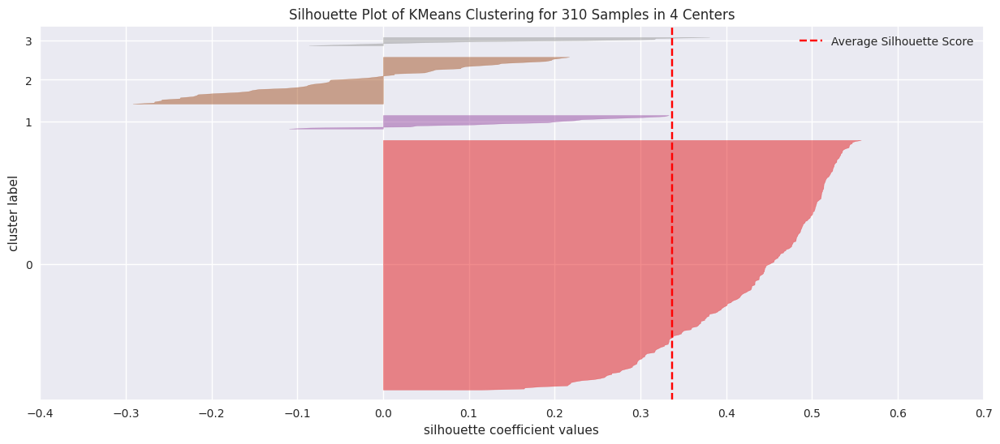

Average Silhouette Score: 0.3366612425043029


In [82]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(data_hc1_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

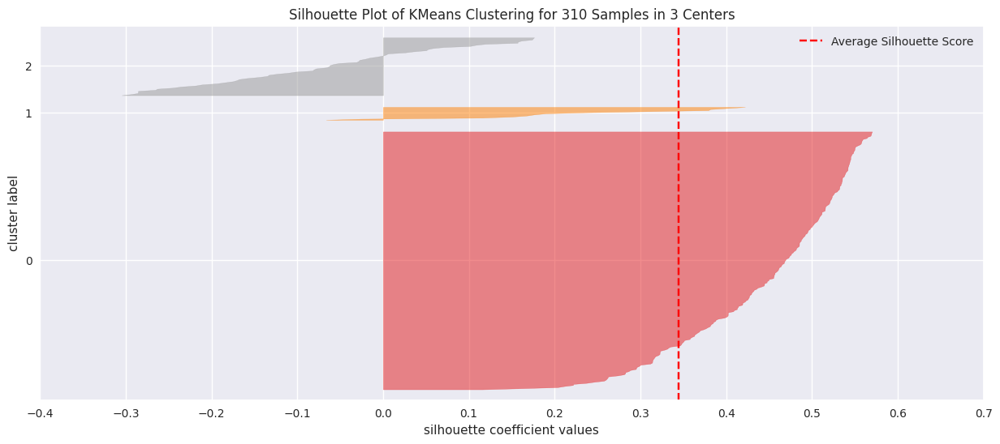

Average Silhouette Score: 0.34468391323129605


In [83]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(data_hc1_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

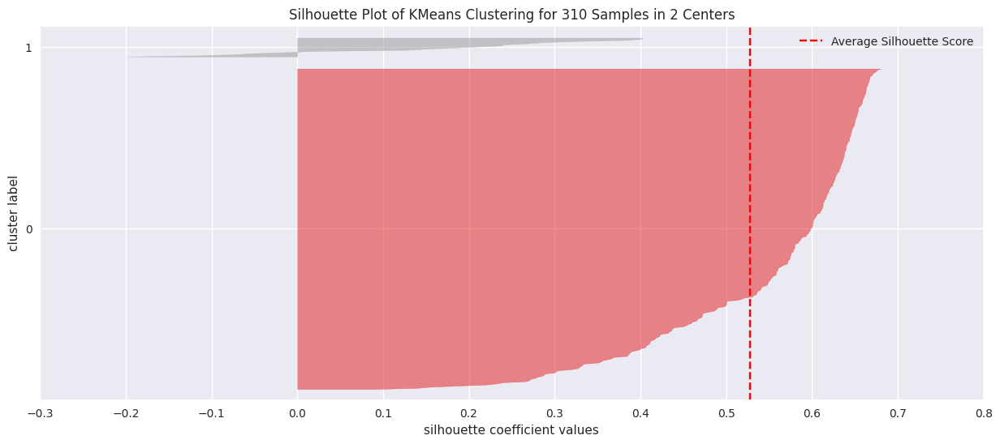

Average Silhouette Score: 0.5280281917752806


In [84]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(2, random_state=1))
visualizer.fit(data_hc1_scaled_df)
visualizer.show()
# Print the average silhouette score
print("Average Silhouette Score:", visualizer.silhouette_score_)

####Observations

Only one of the silhouette scores were above 0.5, suggesting weak structures at best and artifical structures at worst. At k=2, the silhouette score was 0.5272; however, the second group shows many negative silhouette values, suggesting that it is not a solid group. At this point, k-means segmentation will be abandoned in favor of hierarchical clustering.

###Hierarchical Clustering Analysis on Cluster 1

####Cophenetic Correlation

In [85]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(data_hc1_scaled_df, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(data_hc1_scaled_df))
        print("Cophenetic correlation for {} distance and {} linkage is {}.".format(dm.capitalize(), lm, c)
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.8939405736021795.
Cophenetic correlation for Euclidean distance and complete linkage is 0.7951477428294808.
Cophenetic correlation for Euclidean distance and average linkage is 0.9117107113223725.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.7155583590412574.
Cophenetic correlation for Chebyshev distance and single linkage is 0.8733356033482429.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.7507866960899175.
Cophenetic correlation for Chebyshev distance and average linkage is 0.904542270515371.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.8676736083482124.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.841135765883637.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.7320233202696205.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.865528249656145.
Cophenetic corre

In [86]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9117107113223725, which is obtained with Euclidean distance and average linkage.


####Dendrograms

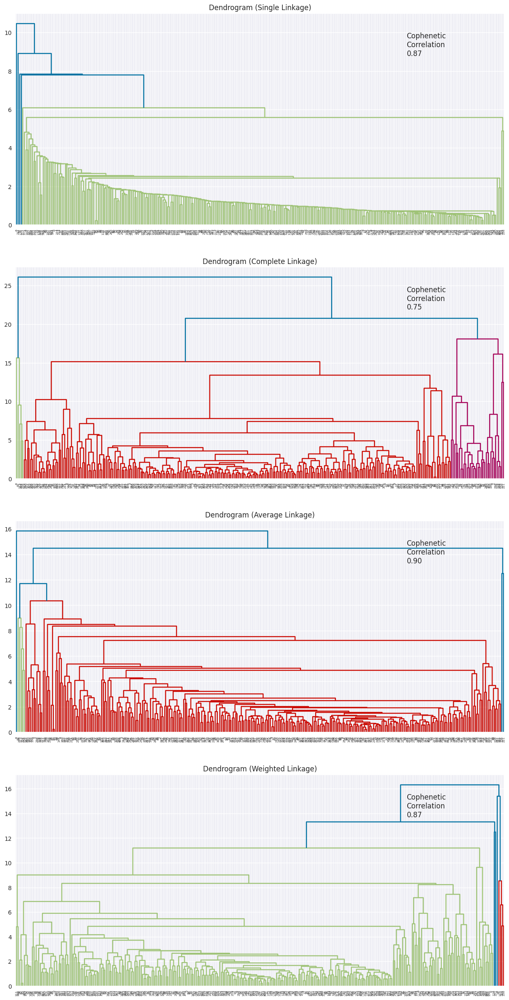

In [87]:
# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(data_hc1_scaled_df, metric="chebyshev", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(data_hc1_scaled_df))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

####Observations
Despite the hope that HC Cluster 1 could be further differentiated, it does not seem feasible without getting into a very high number of clusters.  Overall, it appears that the original breakdown is the best.

## Actionable Insights and Recommendations

- The best scheme for grouping stocks appears to be the hierarchical clustering algorithm with 5 different clusters.

- Most stocks are not able to be distinctly classified by these algorithms.  The business should avoid providing a specific recommendation for these categories.  This holds true for HC Clusters 0 and Cluster 1.

- HC Clusters 2, 3, and 4 all seem to be distinct from the mass of stocks.  The most import of these from a business recommendation perspective is HC cluster 2.

- Cluster 2 contains the stocks 'Allegion', 'Apache Corporation', 'Chesapeake Energy', 'Charter Communications', 'Colgate-Palmolive', 'Kimberly-Clark', and
 'S&P Global, Inc.'  While nothing is certain, these stocks are clearly different from the rest and the company should direct further research into these stocks.  However, they currently seem like solid investments for the company's clients.

 - Clusters 3 and 4 are distinct; however, they may both be worth looking into for newer investors.  These stocks tend to have lower prices and low P/E ratios.  However, unlike other stocks with low P/E ratios, the high net incomes and earnings suggest that they are undervalued compared to other similar stocks.

 - GICS does not seem a reliable indicator of whether a stock is a good investment or not.  To that end, the company may wish to avoid mutual funds and other grouped stock options that rely on GICS as a primary grouping method.


# <a name = "link1">**Appendix**</a>

This is a full Exploratory Data Analysis.  Click <a href = "#link2">here</a> to return to the main text.

In [88]:
#create a copy of the data for eda
eda = df.copy()

## Univariate EDA

### Obsservations on `GICS Sector`

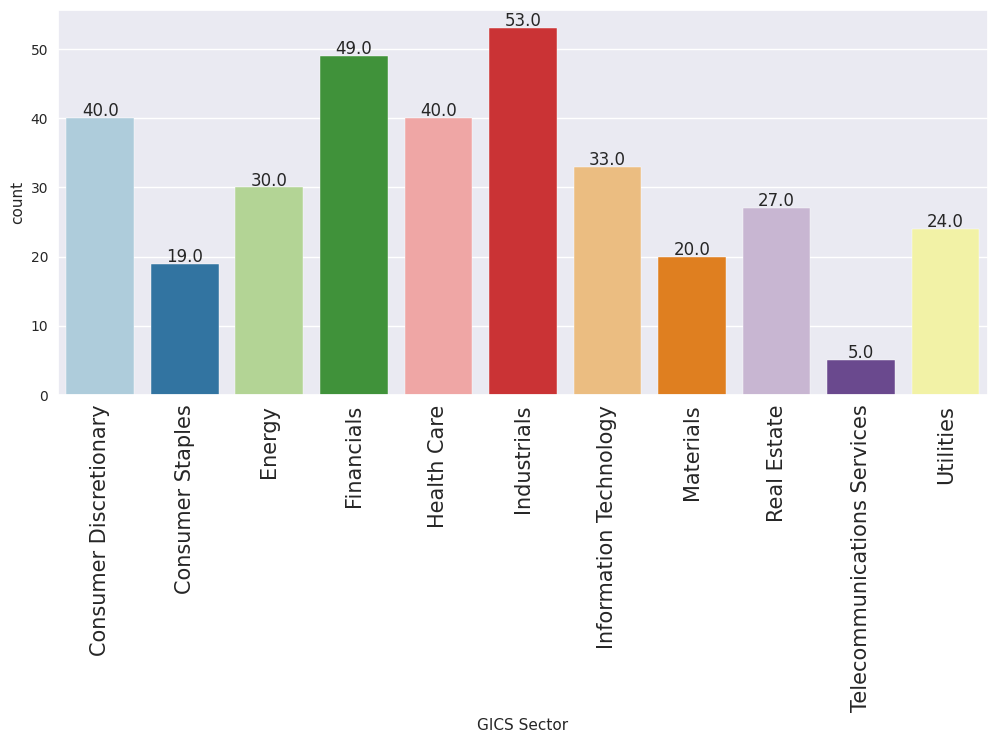

In [89]:
labeled_barplot(eda, 'GICS Sector', perc=False)

The two most common sectors are Industrials (n = 53) and Financials (n = 49).  The least common sector is Telecommunications Services (n = 5).  

### Observations on `Current Price`

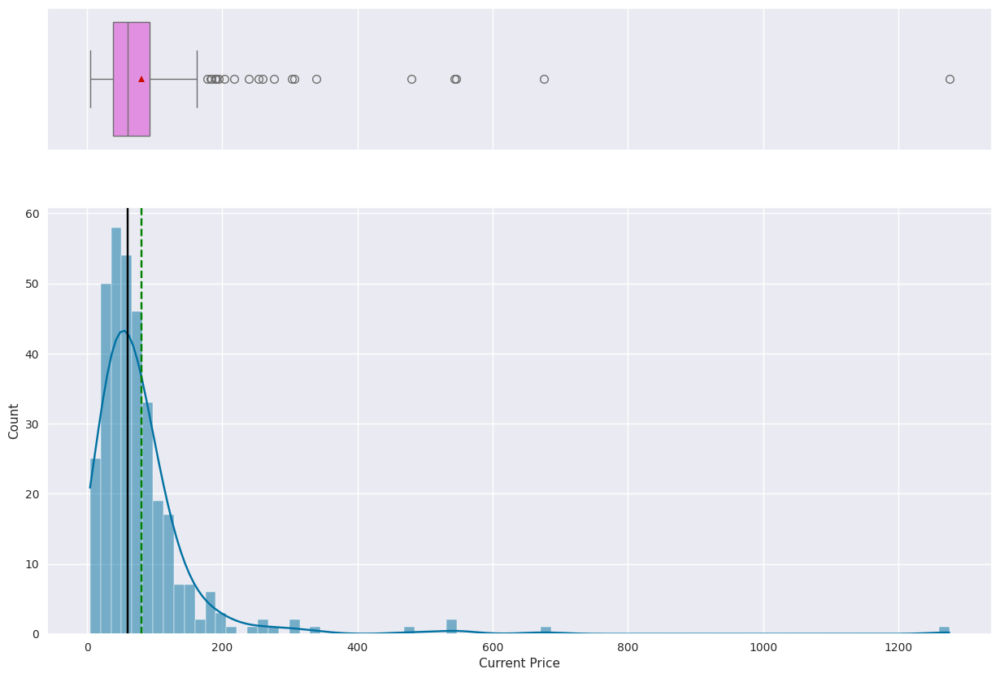


Summary Statistics for Current Price:
count     340.00
mean       80.86
std        98.06
min         4.50
25%        38.55
50%        59.70
75%        92.88
max     1,274.95


In [90]:
histogram_boxplot(eda, 'Current Price', kde=True)

Current price is right skewed.  The mean is \$80.86 with a standard deviation of \$98.06.  The median stock price is \$59.71.

### Observations on `Price Change`

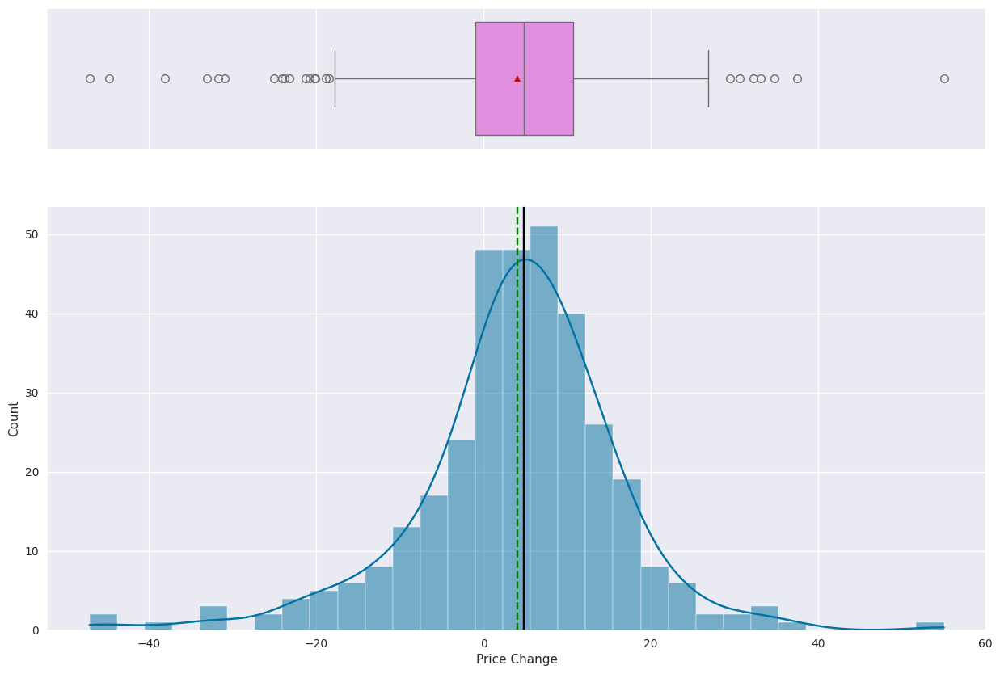


Summary Statistics for Price Change:
count   340.00
mean      4.08
std      12.01
min     -47.13
25%      -0.94
50%       4.82
75%      10.70
max      55.05


In [91]:
histogram_boxplot(eda, 'Price Change', kde=True)

The price change for these 340 stocks is fairly normal with a mean of \$4.08 and a standard deviation of \$12.01.

### Observations on `Volatility`

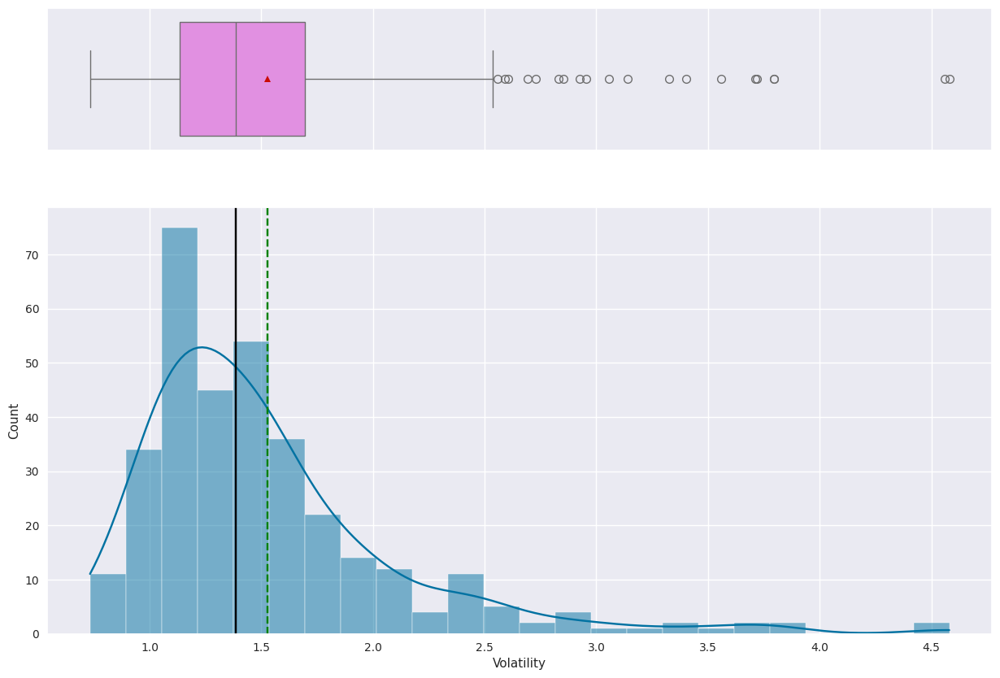


Summary Statistics for Volatility:
count   340.00
mean      1.53
std       0.59
min       0.73
25%       1.13
50%       1.39
75%       1.70
max       4.58


In [92]:
histogram_boxplot(eda, "Volatility", kde = True)

Volatility is right skewed with a mean of \$1.53, a standard deviation of \$0.59, and a median of \$1.39.

###Observations on `ROE`

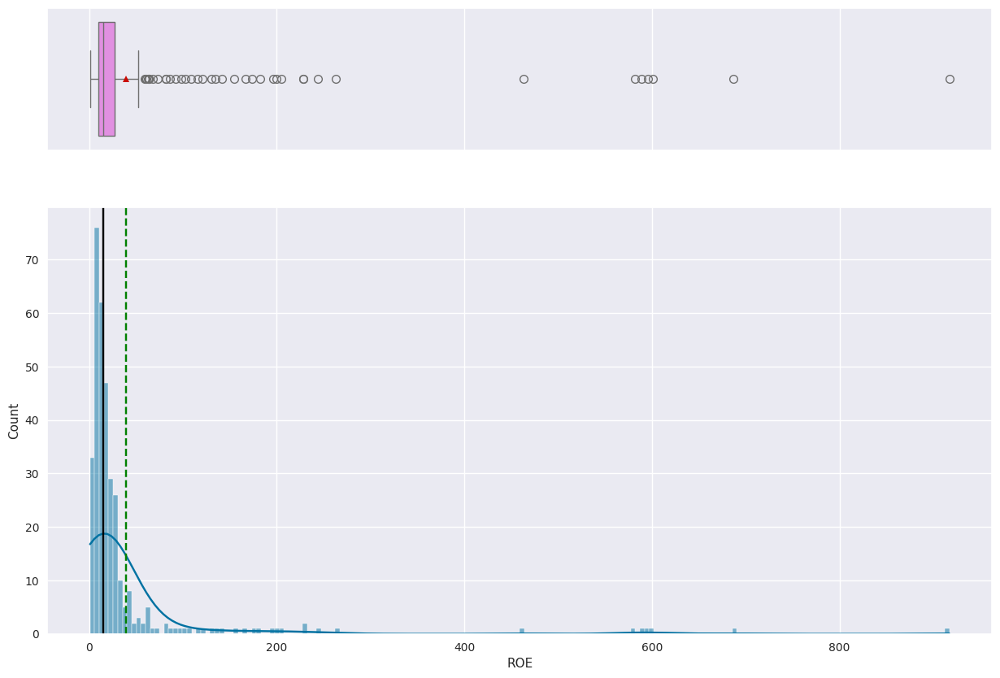


Summary Statistics for ROE:
count   340.00
mean     39.60
std      96.55
min       1.00
25%       9.75
50%      15.00
75%      27.00
max     917.00


In [93]:
histogram_boxplot(eda, "ROE", kde = True)

ROE is heavily right skewed with a few signficantly different outliers.  The mean is 39.0, the standard deviation is 95.55.  The median is 15 and the IQR is 17.25.

### Observations on `Cash Ratio`

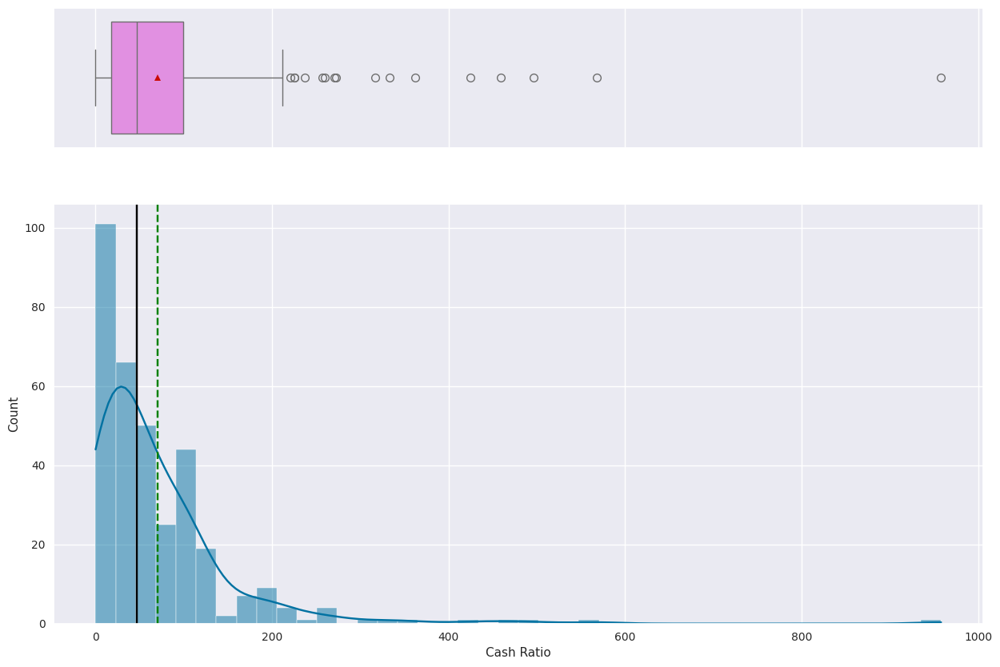


Summary Statistics for Cash Ratio:
count   340.00
mean     70.02
std      90.42
min       0.00
25%      18.00
50%      47.00
75%      99.00
max     958.00


In [94]:
histogram_boxplot(eda, "Cash Ratio", kde = True)

Cash Ratio is also heavily skewed right with a mean of 70.02 and a standard deviation of 90.42.  The median is 47 and the IQR is 81.

### Observations on `Net Cash Flow`

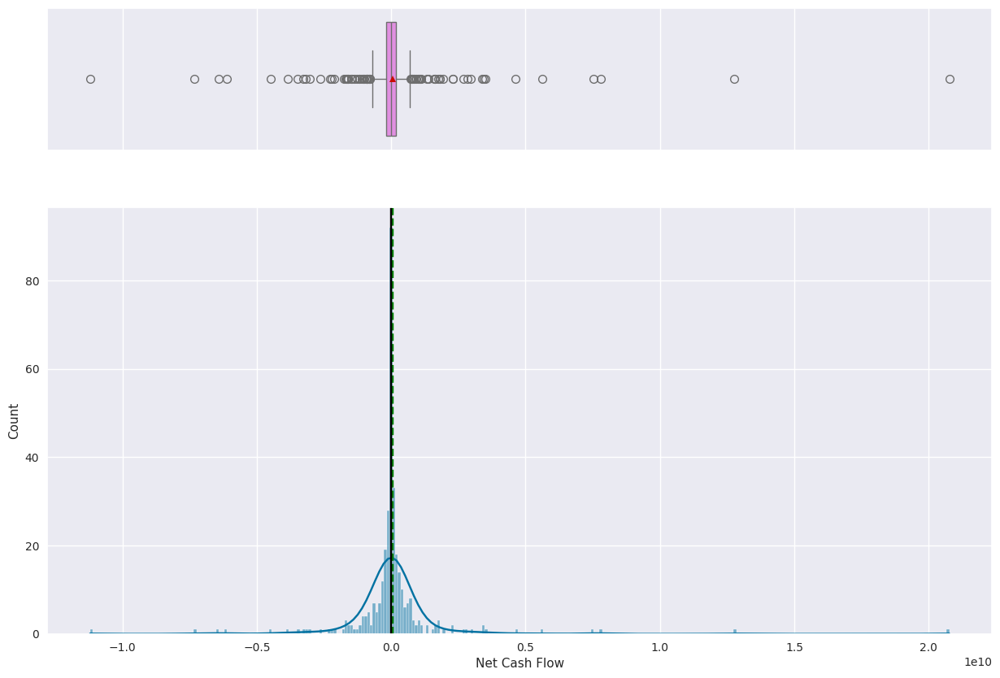


Summary Statistics for Net Cash Flow:
count               340.00
mean         55,537,620.59
std       1,946,365,312.18
min     -11,208,000,000.00
25%        -193,906,500.00
50%           2,098,000.00
75%         169,810,750.00
max      20,764,000,000.00


In [95]:
histogram_boxplot(eda, "Net Cash Flow", kde = True)

Net cash flow appears normal but there are some extremely large and small outliers.  Even working with large multinational corporations, these values beggar belief.  Specifically the minimum value is \$-11.2 Billion and the max is \$20.7 billion.  As a result, these values need to be investigated further.

###Observations on `Net Income`

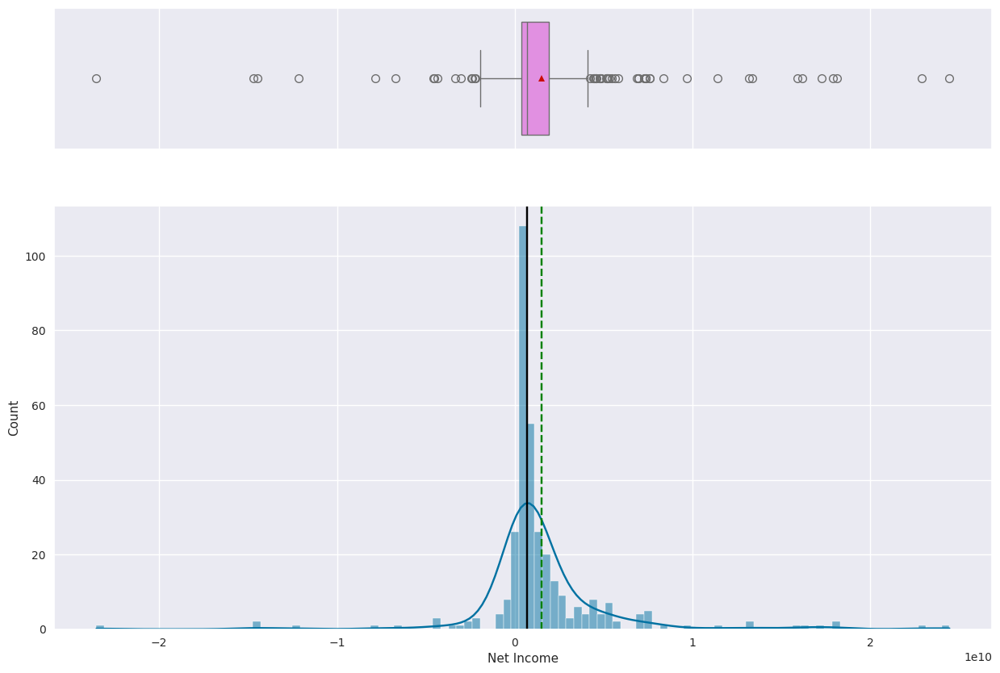


Summary Statistics for Net Income:
count               340.00
mean      1,494,384,602.94
std       3,940,150,279.33
min     -23,528,000,000.00
25%         352,301,250.00
50%         707,336,000.00
75%       1,899,000,000.00
max      24,442,000,000.00


In [96]:
histogram_boxplot(eda, "Net Income", kde = True)

Net income is approximately normal (or slightly right skewed) with a mean of \$1.494 billion and a standard deviation of \$3.94 billion.  

###Observations on `Earning Per Share`

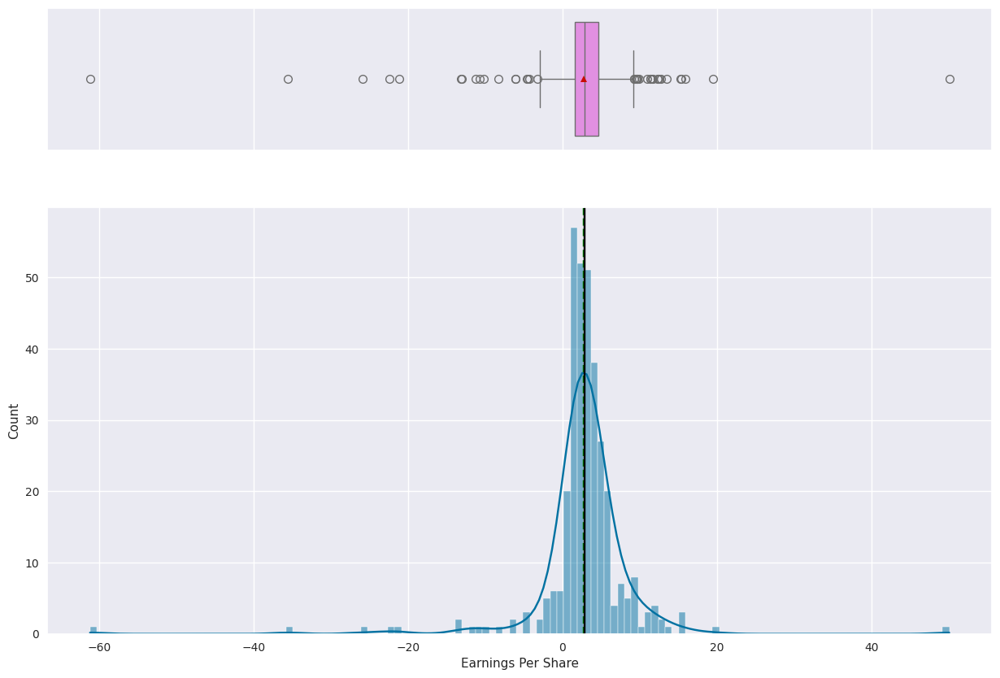


Summary Statistics for Earnings Per Share:
count   340.00
mean      2.78
std       6.59
min     -61.20
25%       1.56
50%       2.90
75%       4.62
max      50.09


In [97]:
histogram_boxplot(eda, "Earnings Per Share", kde = True)

Earnings Per share is normally distributed with a few outliers in either direction.  The mean is \$2.78 and the standard deviation is \$6.59.

###Obsevations on `Estimated Shares Outstanding`

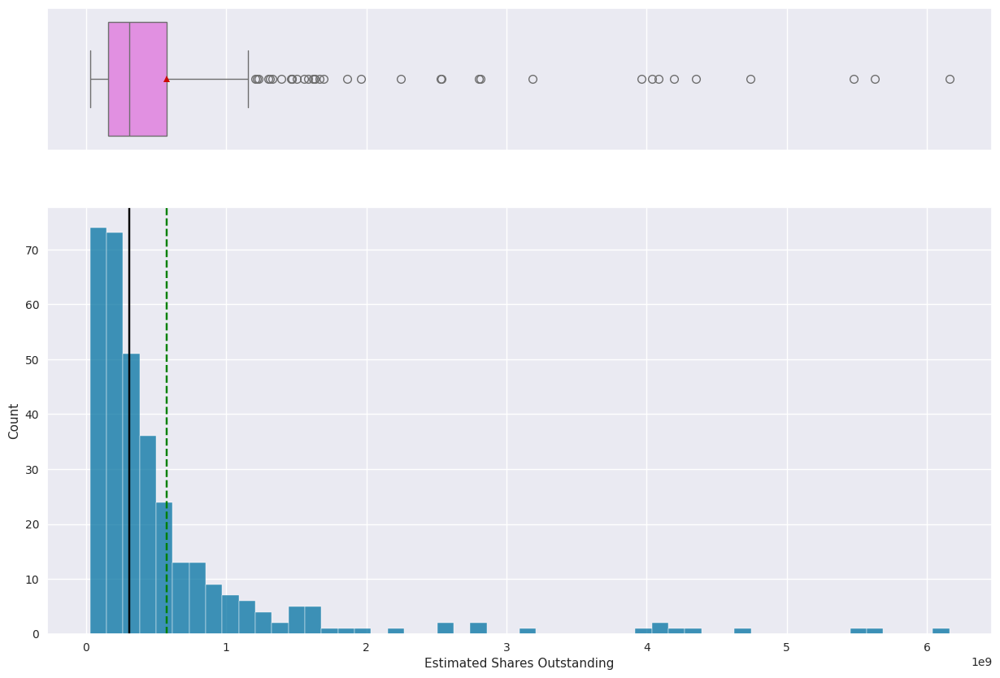


Summary Statistics for Estimated Shares Outstanding:
count             340.00
mean      577,028,337.75
std       845,849,595.42
min        27,672,156.86
25%       158,848,216.10
50%       309,675,137.80
75%       573,117,457.32
max     6,159,292,035.00


In [98]:
histogram_boxplot(eda, "Estimated Shares Outstanding")

Estimated Shares Outstanding is heavily right skewed with a mean around 577 million and a standard devation around 845.8 million.  The median for this variable is around 309.7 million.

###Obsevations on `P/E Ratio`

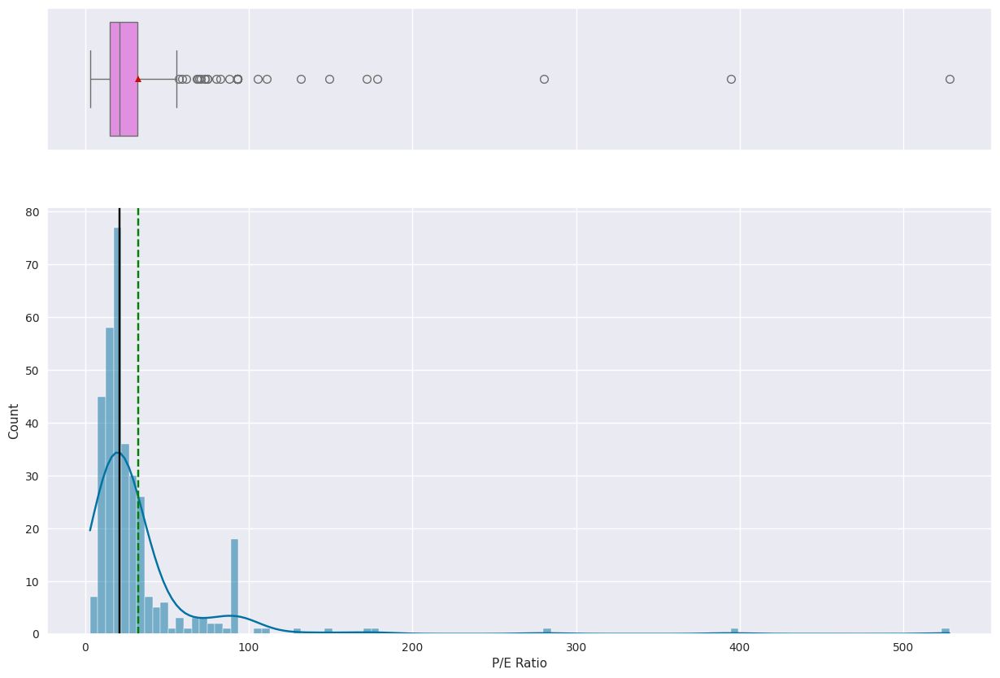


Summary Statistics for P/E Ratio:
count   340.00
mean     32.61
std      44.35
min       2.94
25%      15.04
50%      20.82
75%      31.76
max     528.04


In [99]:
histogram_boxplot(eda, "P/E Ratio", kde = True)

As expected based on the variables above, the P/E Ratio is also heavily right skewed with a mean of 32.61, a standard deviation of 44.35.  The median is 20.82 and the IQR is 16.72.

###Observations on `P/B Ratio`

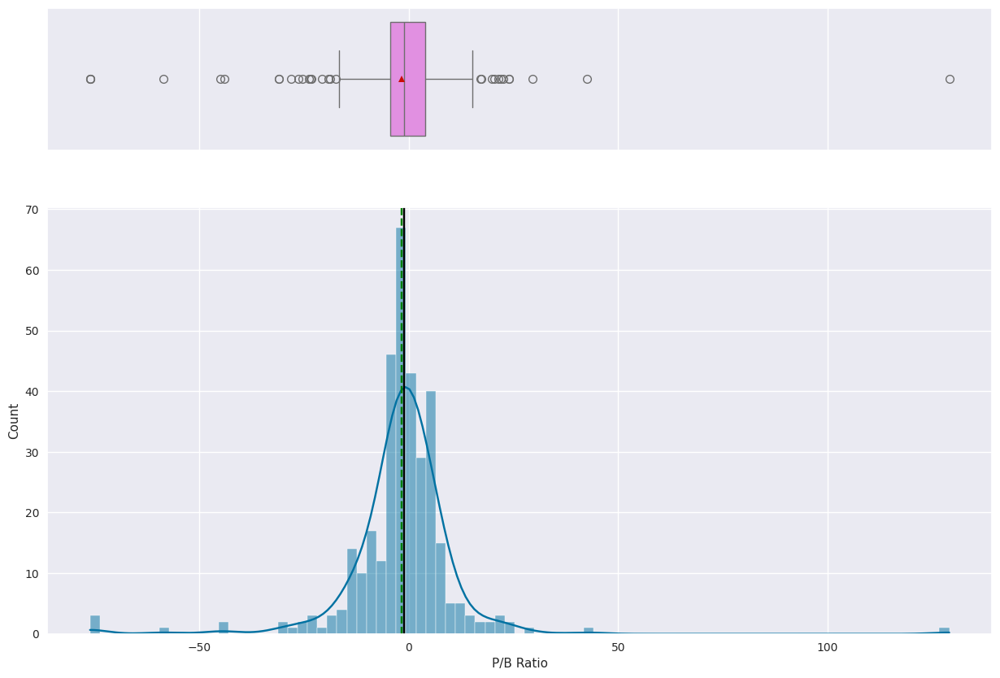


Summary Statistics for P/B Ratio:
count   340.00
mean     -1.72
std      13.97
min     -76.12
25%      -4.35
50%      -1.07
75%       3.92
max     129.06


In [100]:
histogram_boxplot(eda, "P/B Ratio", kde = True)

The P/B ratio is normally distributed with a few outliers in either direction.  The mean is -1.72 and the standard devation is 13.97.

##Bivariate Analysis

###Observations on `GICS Sector` and `GICS Sub Industry4`

In [123]:
from IPython.display import display
pd.set_option("display.max_rows", None)
crosstab_table = pd.crosstab(eda["GICS Sub Industry"], eda["GICS Sector"])
display(crosstab_table)

GICS Sector,Consumer Discretionary,Consumer Staples,Energy,Financials,Health Care,Industrials,Information Technology,Materials,Real Estate,Telecommunications Services,Utilities
GICS Sub Industry,,,,,,,,,,,
Advertising,2,0,0,0,0,0,0,0,0,0,0
Aerospace & Defense,0,0,0,0,0,4,0,0,0,0,0
Agricultural Products,0,1,0,0,0,0,0,0,0,0,0
Air Freight & Logistics,0,0,0,0,0,3,0,0,0,0,0
Airlines,0,0,0,0,0,5,0,0,0,0,0
Alternative Carriers,0,0,0,0,0,0,0,0,0,1,0
"Apparel, Accessories & Luxury Goods",1,0,0,0,0,0,0,0,0,0,0
Application Software,0,0,0,0,0,0,2,0,0,0,0
Asset Management & Custody Banks,0,0,0,4,0,0,0,0,0,0,0


GICS Sub Industry            Advertising  Aerospace & Defense  \
GICS Sector                                                     
Consumer Discretionary                 2                    0   
All                                    2                    4   
Energy                                 0                    0   
Consumer Staples                       0                    0   
Financials                             0                    0   
Health Care                            0                    0   
Information Technology                 0                    0   
Industrials                            0                    4   
Materials                              0                    0   
Real Estate                            0                    0   
Telecommunications Services            0                    0   
Utilities                              0                    0   

GICS Sub Industry            Agricultural Products  Air Freight & Logistics  \
GICS Secto

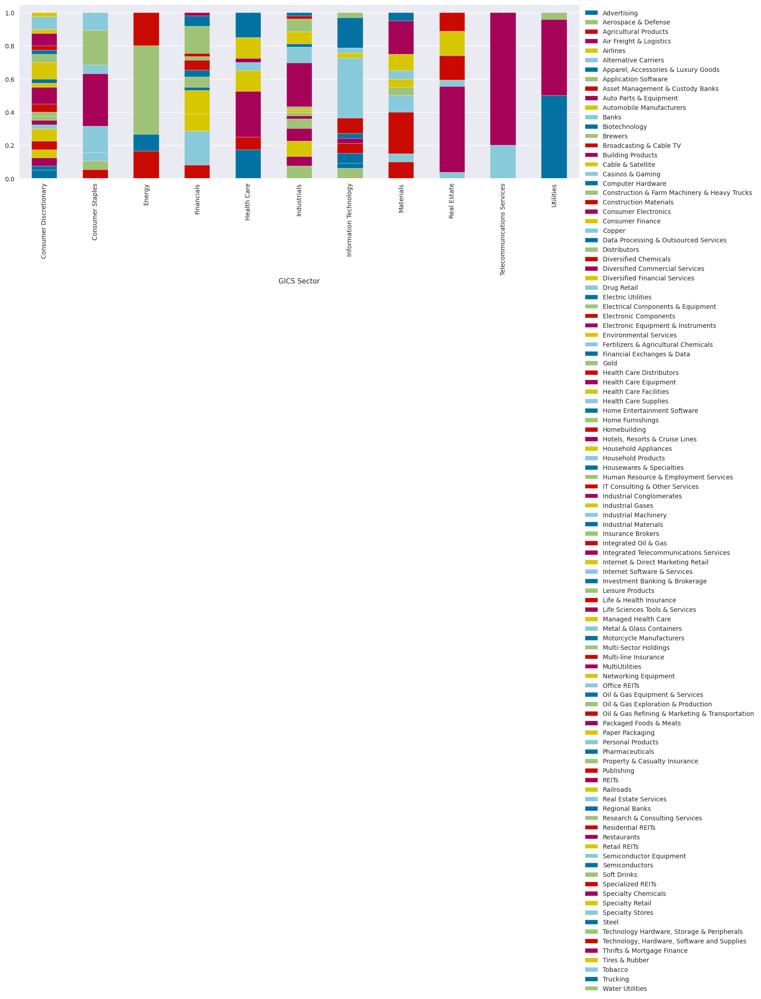

In [101]:
stacked_barplot(eda, 'GICS Sector', 'GICS Sub Industry')

The high number of Sub Industries prevents any meaningful patterns from emerging.  Even the fewer number of sub industries in Telecommunications may simply be due to the small number of observations in that industry.

### Observations on `Current Price` by `GICS Sector`

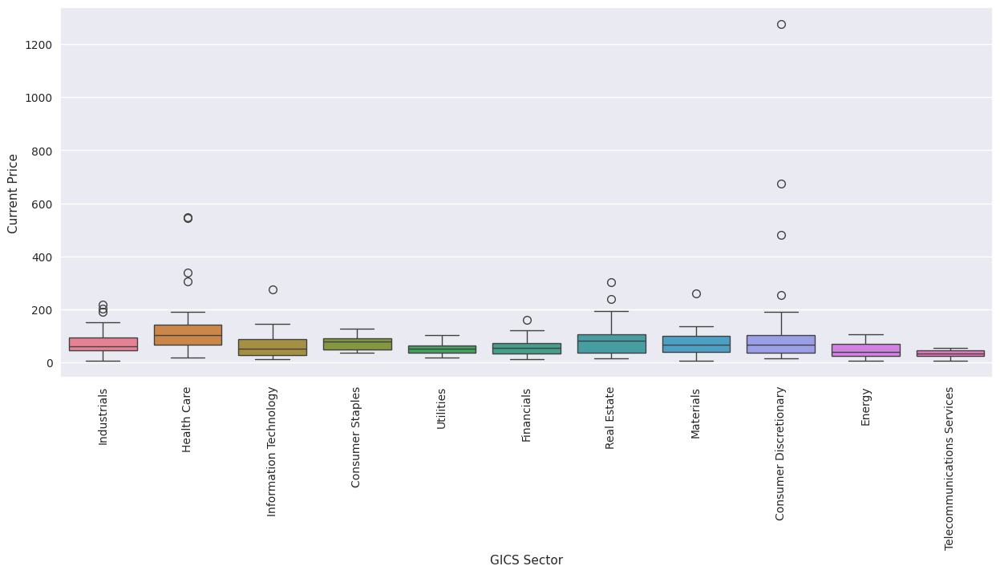

Mean Price by GICS Sector:
GICS Sector
Consumer Discretionary        128.10
Consumer Staples               71.97
Energy                         46.04
Financials                     58.66
Health Care                   132.05
Industrials                    74.41
Information Technology         63.55
Materials                      76.55
Real Estate                    90.98
Telecommunications Services    32.96
Utilities                      52.97
Name: Current Price, dtype: float64


In [102]:
sns.boxplot(data=eda, x='GICS Sector', y='Current Price', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Price by GICS Sector:\n{eda.groupby('GICS Sector')['Current Price'].mean()}")

The price is fairly uniformly distributed across the different sectors.  However, there are high end outliers in seven of the sectors.

###Observations on `Price Change` by `GICS Sector`

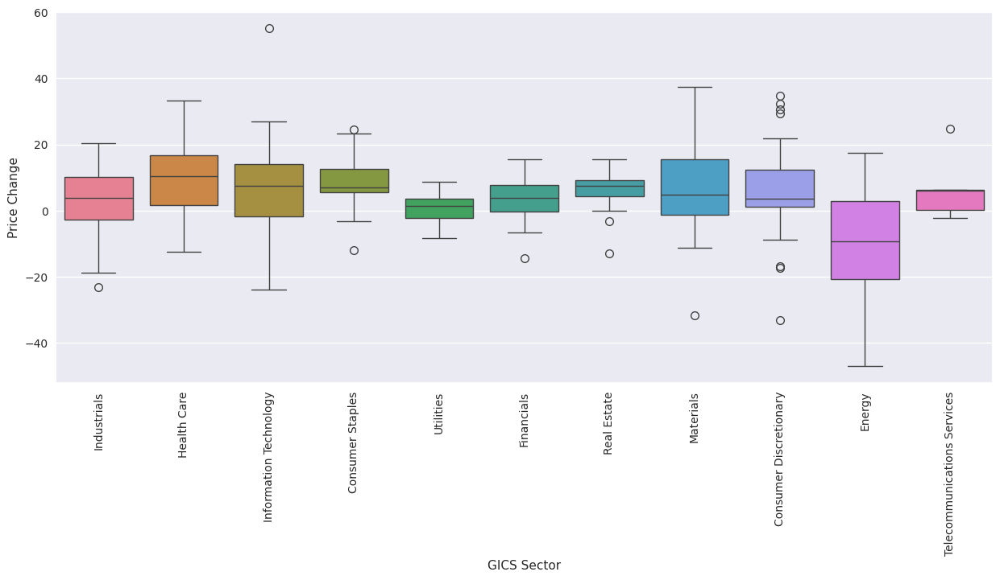

Mean Price Change by GICS Sector:
GICS Sector
Consumer Discretionary          5.85
Consumer Staples                8.68
Energy                        -10.23
Financials                      3.87
Health Care                     9.59
Industrials                     2.83
Information Technology          7.22
Materials                       5.59
Real Estate                     6.21
Telecommunications Services     6.96
Utilities                       0.80
Name: Price Change, dtype: float64


In [103]:
sns.boxplot(data=eda, x='GICS Sector', y='Price Change', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Price Change by GICS Sector:\n{eda.groupby('GICS Sector')['Price Change'].mean()}")

Energy as a sector has an overall negative growth.  Other sectors, such as Utilities and Industrials show very limited change in prices.  Health Care, Consumer Staples, and Information Technology, all appear to have the largest postive average price change as industries.

###Observations on `Volatility` and 'GICS Sector`

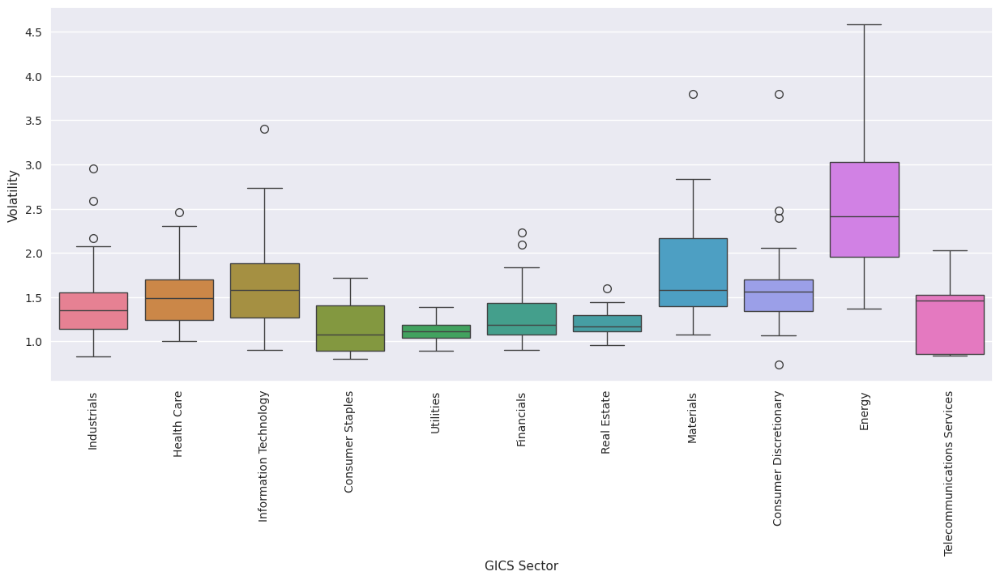

Mean Volatility by GICS Sector:
GICS Sector
Consumer Discretionary        1.60
Consumer Staples              1.15
Energy                        2.57
Financials                    1.27
Health Care                   1.54
Industrials                   1.42
Information Technology        1.66
Materials                     1.82
Real Estate                   1.21
Telecommunications Services   1.34
Utilities                     1.12
Name: Volatility, dtype: float64


In [104]:
sns.boxplot(data=eda, x='GICS Sector', y='Volatility', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Volatility by GICS Sector:\n{eda.groupby('GICS Sector')['Volatility'].mean()}")

In [105]:
#ANOVA of Volatility by GICS Sector
from scipy.stats import f_oneway

# Group Volatility by GICS Sector and pass as separate samples to f_oneway
f_stat, p_val = f_oneway(*eda.groupby('GICS Sector')['Volatility'].apply(list).values)
print(f"F-statistic: {f_stat:.2f}")
print(f"P-value: {p_val:.3f}")

#Perform Tukey's HSD on the output
from statsmodels.stats.multicomp import pairwise_tukeyhsd
tukey_results = pairwise_tukeyhsd(eda['Volatility'], eda['GICS Sector'])
print(tukey_results)

F-statistic: 22.79
P-value: 0.000
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
     Consumer Discretionary            Consumer Staples  -0.4428 0.0269 -0.8598 -0.0258   True
     Consumer Discretionary                      Energy   0.9733    0.0  0.6118  1.3348   True
     Consumer Discretionary                  Financials  -0.3282 0.0376 -0.6471 -0.0093   True
     Consumer Discretionary                 Health Care  -0.0545    1.0 -0.3891  0.2802  False
     Consumer Discretionary                 Industrials  -0.1785 0.7517  -0.492   0.135  False
     Consumer Discretionary      Information Technology   0.0643    1.0 -0.2876  0.4163  False
     Consumer Discretionary                   Materials   0.2212 0.8083 -0.1886  0.6311  False
     Consumer Di

Overall, the volatility is similar across different sectors.  However, Energy seems to have a larger volatility than  do the other industries.  As seen in the one way ANOVA and post-hoc test, the volatility of Energy is signficantly different from all other sectors.

###Observations on `ROE` by `GICS Sector`

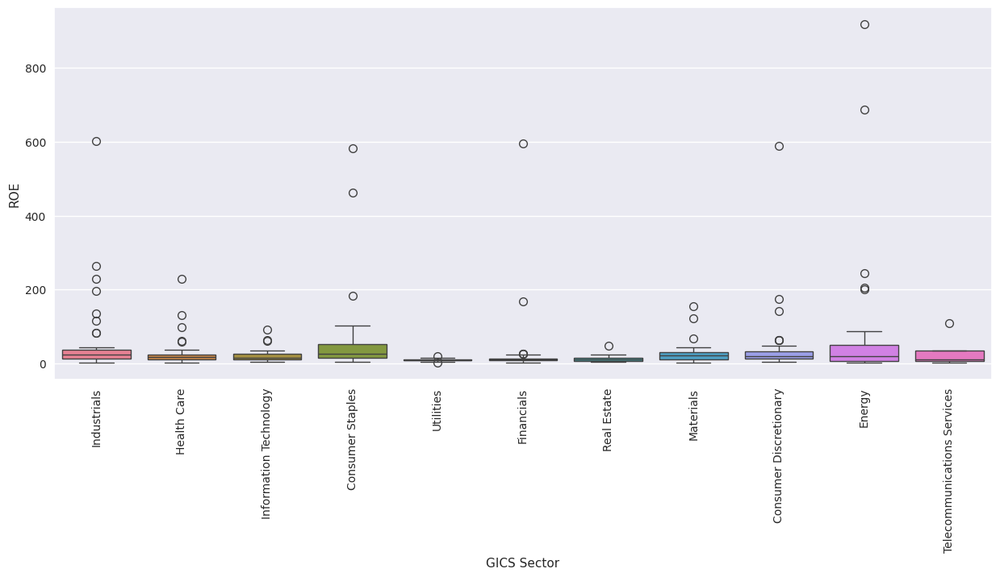

Mean ROE by GICS Sector:
GICS Sector
Consumer Discretionary        44.90
Consumer Staples              89.42
Energy                        93.20
Financials                    26.29
Health Care                   27.77
Industrials                   50.15
Information Technology        21.79
Materials                     33.00
Real Estate                   12.44
Telecommunications Services   32.60
Utilities                      9.88
Name: ROE, dtype: float64


In [106]:
sns.boxplot(data=eda, x='GICS Sector', y='ROE', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean ROE by GICS Sector:\n{eda.groupby('GICS Sector')['ROE'].mean()}")

Due to outliers in every single sector, there is not visual difference in ROE by sector. However, Energy again is a standout with the highest average ROE at 90.20, while Utilities has the lowest ROE at 9.88.

###Observations on `Cash Ratio` by `GICS Sector`

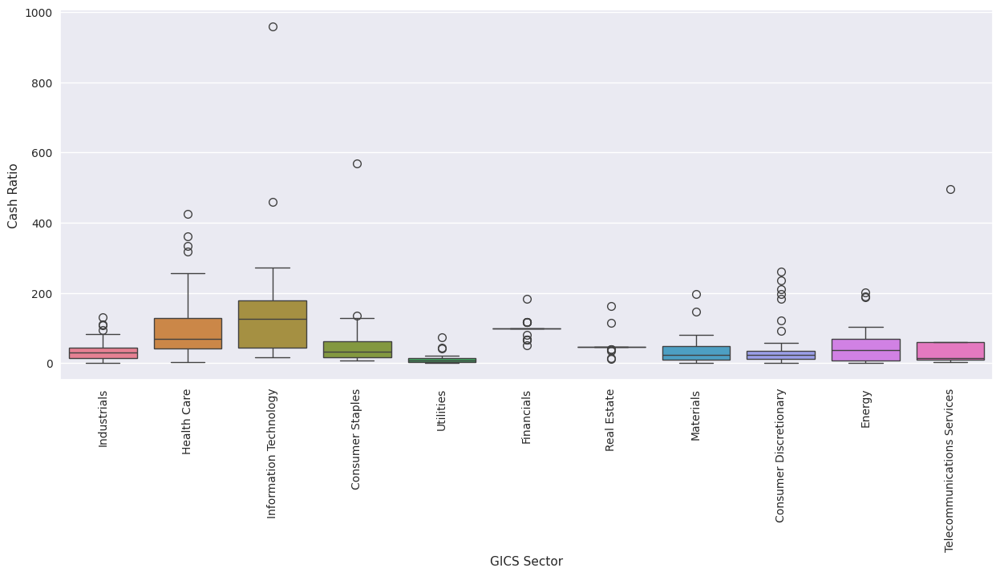

Mean Cash Ratio by GICS Sector:
GICS Sector
Consumer Discretionary         49.58
Consumer Staples               70.95
Energy                         51.13
Financials                     98.59
Health Care                   103.78
Industrials                    36.19
Information Technology        149.82
Materials                      41.70
Real Estate                    50.11
Telecommunications Services   117.00
Utilities                      13.62
Name: Cash Ratio, dtype: float64


In [107]:
sns.boxplot(data=eda, x='GICS Sector', y='Cash Ratio', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Cash Ratio by GICS Sector:\n{eda.groupby('GICS Sector')['Cash Ratio'].mean()}")

There is quite a bit of difference in the Cash Ratio based on sectors.  Sectors with the greatest cash ratio are Information Technology, Telecommunications Services and Health Care.  The industries with the lowest cash ratio are Utilities, Industrials, and Materials.

###Observations on `Net Cash Flow` and `GICS Sector`

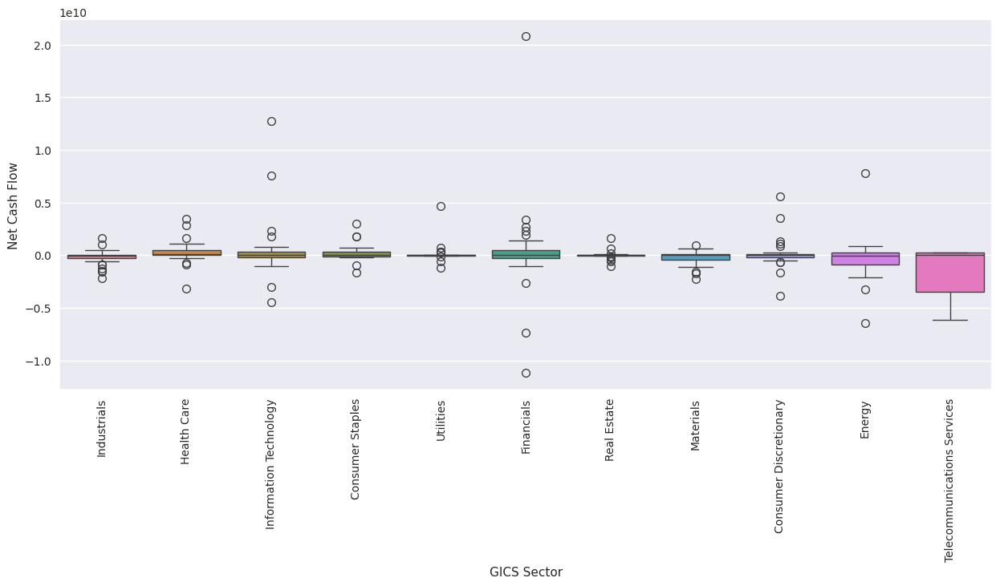

Mean Net Cash Flow by GICS Sector:
GICS Sector
Consumer Discretionary            84,213,175.00
Consumer Staples                 258,627,210.53
Energy                          -308,318,233.33
Financials                       254,356,306.12
Health Care                      262,687,800.00
Industrials                     -160,103,150.94
Information Technology           483,099,121.21
Materials                       -291,236,850.00
Real Estate                        3,546,703.70
Telecommunications Services   -1,816,800,000.00
Utilities                        176,462,291.67


In [108]:
sns.boxplot(data=eda, x='GICS Sector', y='Net Cash Flow', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Net Cash Flow by GICS Sector:\n{eda.groupby('GICS Sector')['Net Cash Flow'].mean().to_string(float_format='{:,.2f}'.format)}")

Again, there appears to be a distinction in the different sectors.  Energy, Industrials, Materials, and Telecommunication Services all have a negative net cash flow.  At the other end of the spectru, Information Technology, Health Care, and Consumer Staples all have the three highest cash flows.

###Observations on `Net Income` and `GICS Sector`

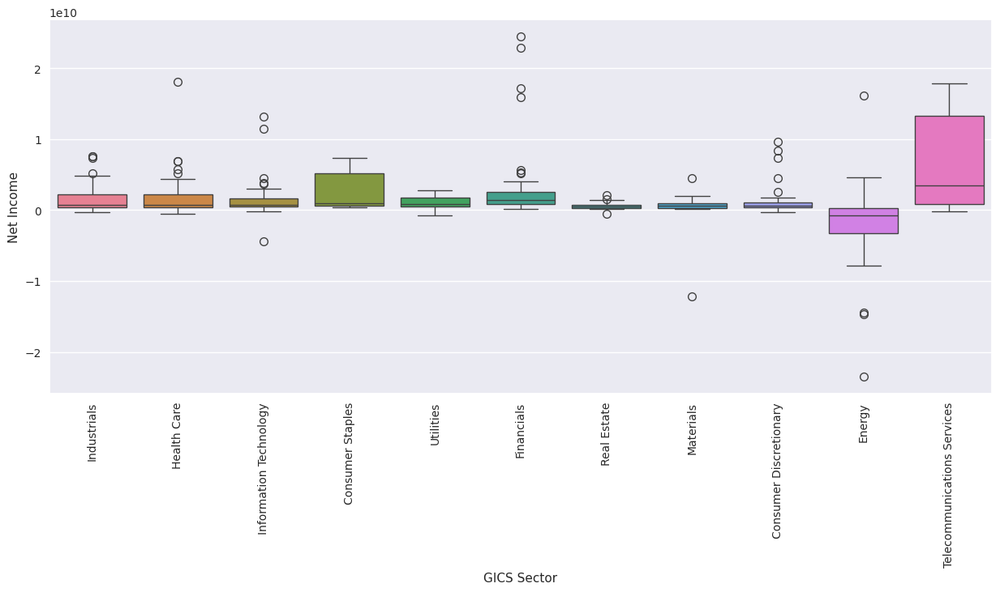

Mean Net Income by GICS Sector:
GICS Sector
Consumer Discretionary         1,373,450,075.00
Consumer Staples               2,518,833,052.63
Energy                        -2,087,527,466.67
Financials                     3,202,677,979.59
Health Care                    2,018,515,350.00
Industrials                    1,722,373,113.21
Information Technology         1,701,587,272.73
Materials                        278,516,500.00
Real Estate                      567,775,740.74
Telecommunications Services    7,067,800,000.00
Utilities                      1,107,145,541.67


In [109]:
sns.boxplot(data=eda, x='GICS Sector', y='Net Income', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Net Income by GICS Sector:\n{eda.groupby('GICS Sector')['Net Income'].mean().to_string(float_format='{:,.2f}'.format)}")

Energy is the only sector with a negative average net income. Surprisingly (based on early graphs) the sector with the highest positive net income was telecommunication services, followed by financials, consumer staples, and health care.

###Observations on `Estimated Shares Outstanding` and `GICS Sector`

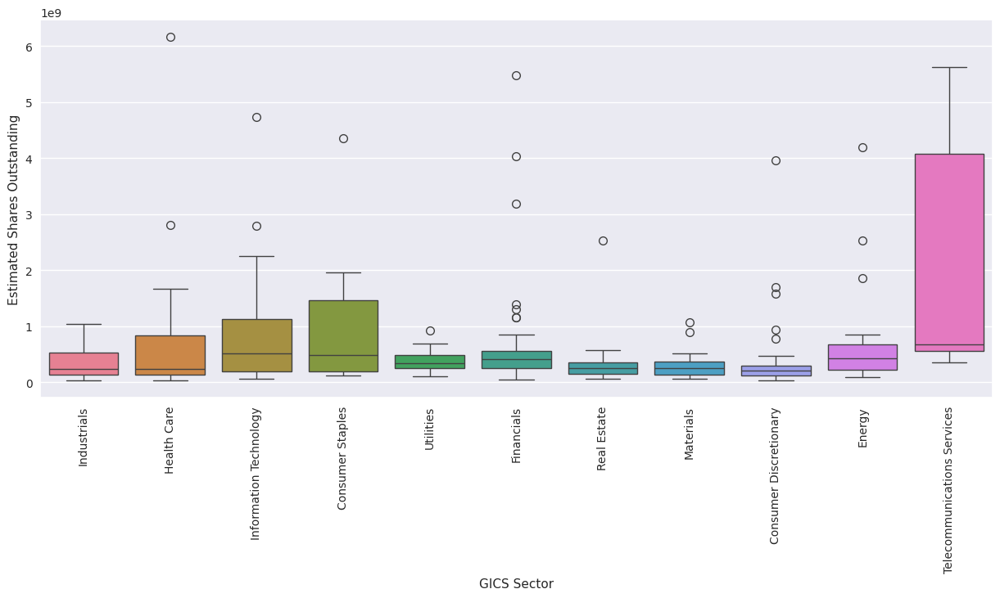

Mean Estimated Shares Outstanding by GICS Sector:
GICS Sector
Consumer Discretionary          399,651,258.32
Consumer Staples                913,685,176.71
Energy                          663,528,783.07
Financials                      683,877,334.85
Health Care                     684,595,513.89
Industrials                     354,716,946.84
Information Technology          828,278,930.79
Materials                       308,524,571.47
Real Estate                     344,454,019.89
Telecommunications Services   2,259,575,293.52
Utilities                       380,919,306.56


In [110]:
sns.boxplot(data=eda, x='GICS Sector', y='Estimated Shares Outstanding', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean Estimated Shares Outstanding by GICS Sector:\n{eda.groupby('GICS Sector')['Estimated Shares Outstanding'].mean().to_string(float_format='{:,.2f}'.format)}")

In [111]:
#Estimated Shares outstanding as a proportion of the number of companies per GICS sector
share_prop = eda.groupby('GICS Sector')['Estimated Shares Outstanding'].mean()/eda.groupby('GICS Sector')['Estimated Shares Outstanding'].count()
print(f"Estimated Shares Outstanding as a Proportion of the Number of Companies per GICS Sector:\n{share_prop.to_string(float_format='{:,.2f}'.format)}")

Estimated Shares Outstanding as a Proportion of the Number of Companies per GICS Sector:
GICS Sector
Consumer Discretionary          9,991,281.46
Consumer Staples               48,088,693.51
Energy                         22,117,626.10
Financials                     13,956,680.30
Health Care                    17,114,887.85
Industrials                     6,692,772.58
Information Technology         25,099,361.54
Materials                      15,426,228.57
Real Estate                    12,757,556.29
Telecommunications Services   451,915,058.70
Utilities                      15,871,637.77


Telecommunications Services has the highest average number of outstanding shares overall and has the highest proportion of shares per company in that sector.  Industrials, while not the lowest average number of shares overall, has the lowest proportion of shares per company.

###Observations on `P/E Ratio` by `GICS Sector`

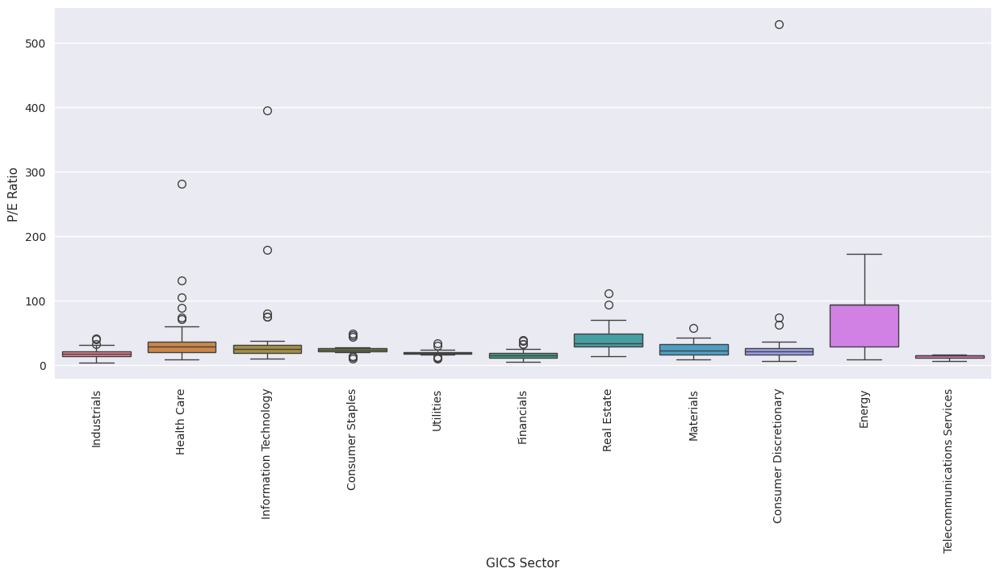

Mean P/E Ratio by GICS Sector:
GICS Sector
Consumer Discretionary        35.21
Consumer Staples              25.52
Energy                        72.90
Financials                    16.02
Health Care                   41.14
Industrials                   18.26
Information Technology        43.78
Materials                     24.59
Real Estate                   43.07
Telecommunications Services   12.22
Utilities                     18.72
Name: P/E Ratio, dtype: float64


In [112]:
sns.boxplot(data=eda, x='GICS Sector', y='P/E Ratio', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean P/E Ratio by GICS Sector:\n{eda.groupby('GICS Sector')['P/E Ratio'].mean()}")

Energy, Information Technology, and Real Estate have the highest average P/E Ratios while Telecommunication Services, Industrials, and Utilities have the lowest.  I will look at each individual company's P/E ratio below to see if any trends within each secctor appear.

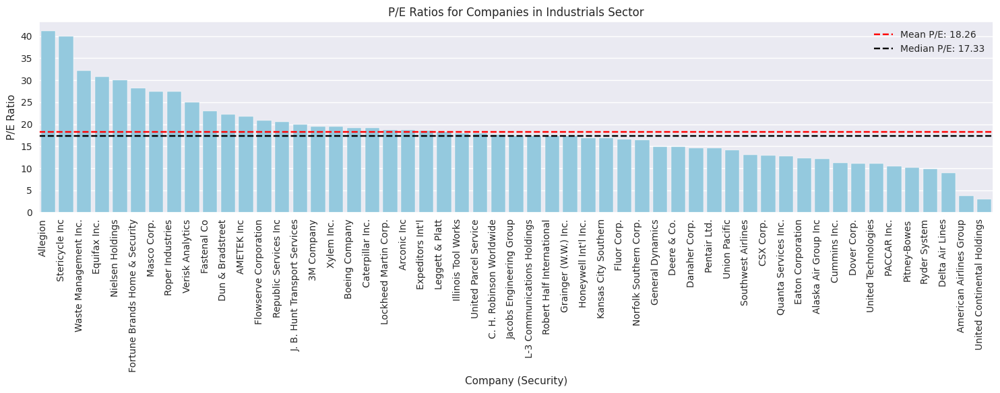

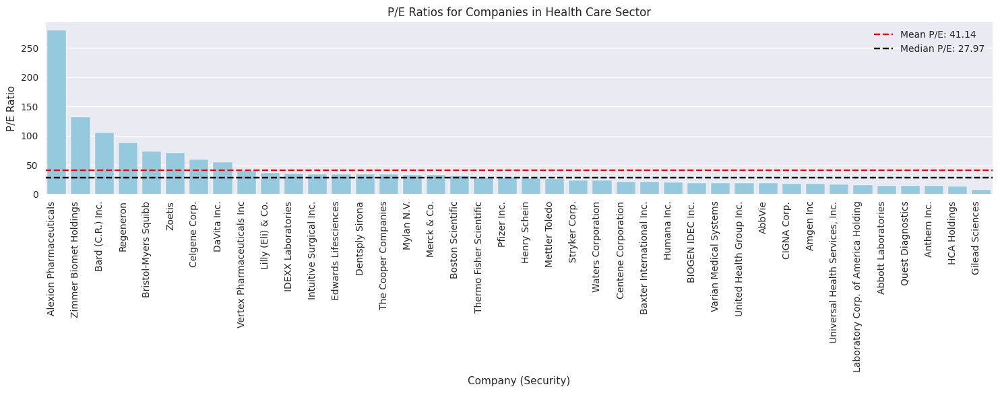

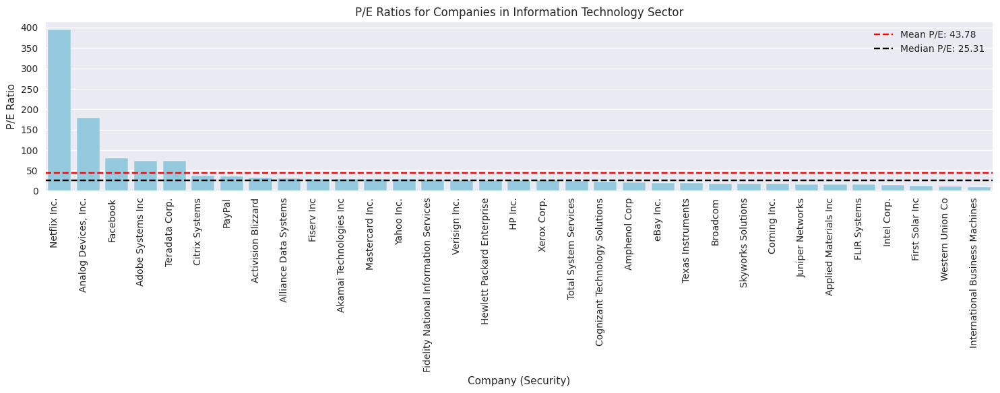

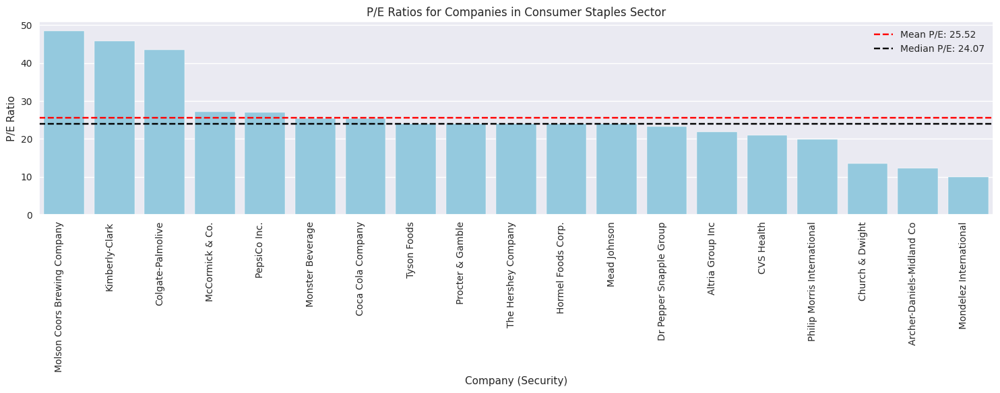

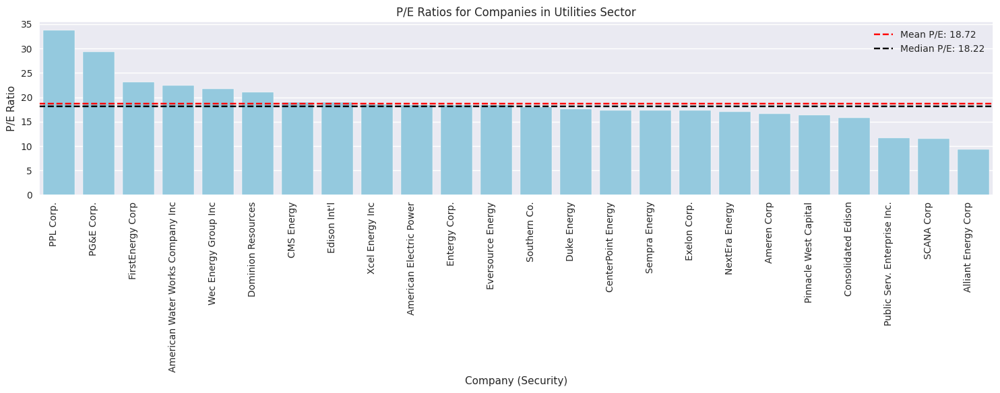

...

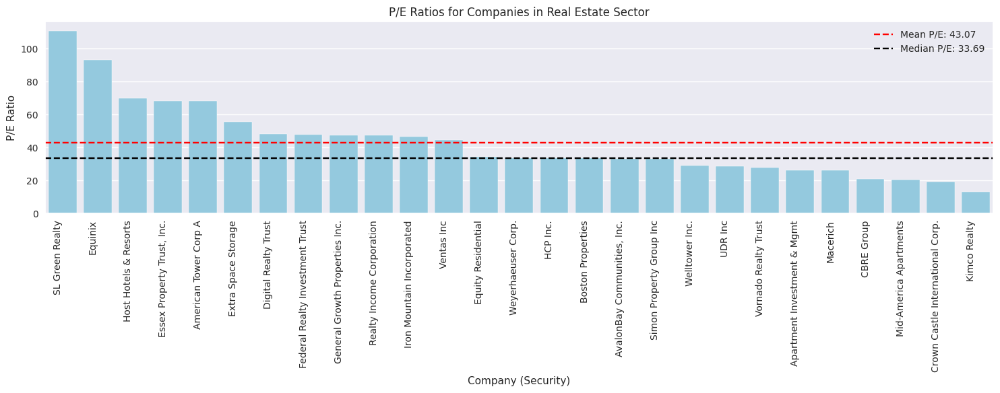

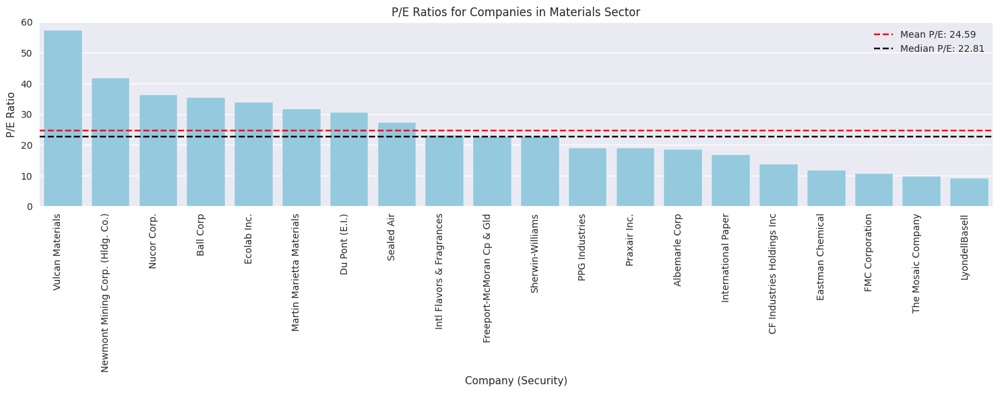

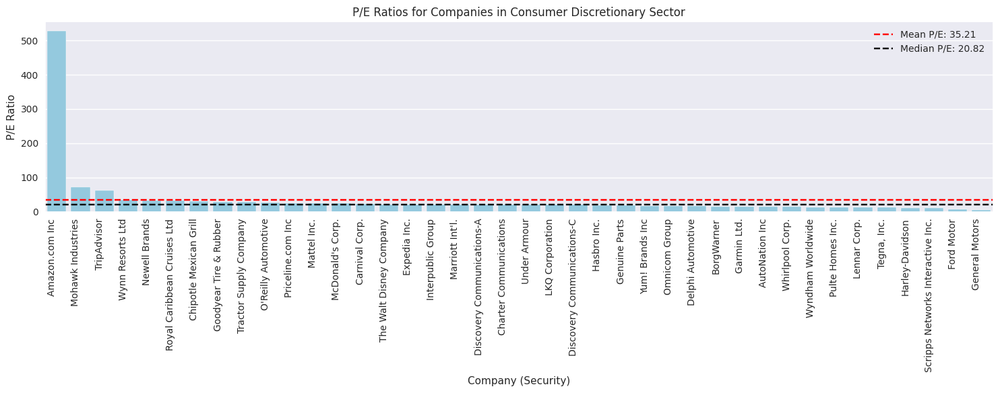

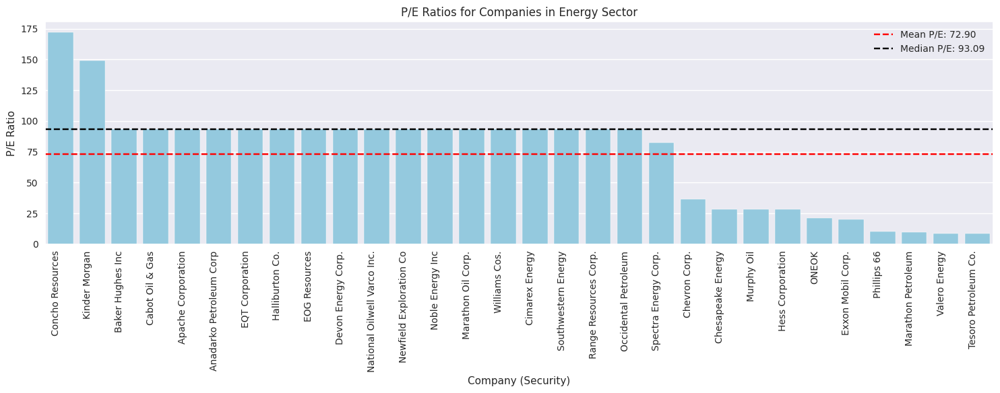

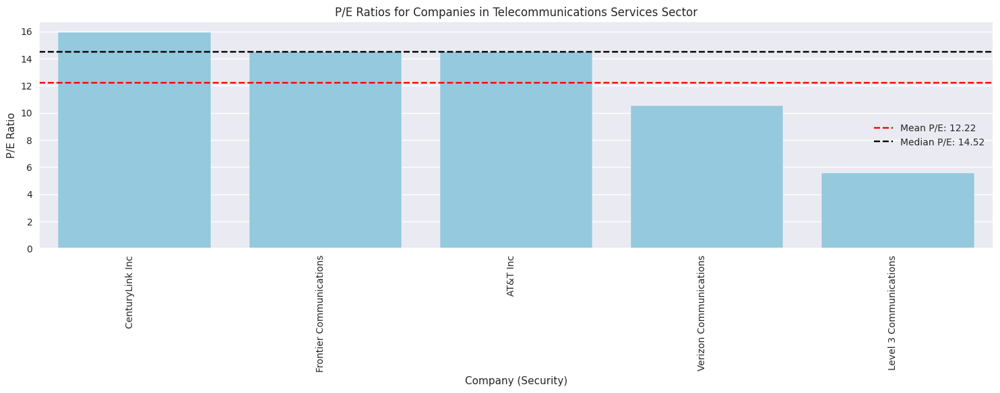

In [113]:
#detailed P/E breakdown with each sector
unique_sectors = eda['GICS Sector'].unique()

for sector in unique_sectors:
    sector_data = eda[eda['GICS Sector'] == sector].sort_values(by='P/E Ratio', ascending=False)

    plt.figure(figsize=(15, 6))
    sns.barplot(data=sector_data, x='Security', y='P/E Ratio', color='skyblue') # Uniform color
    plt.title(f'P/E Ratios for Companies in {sector} Sector')
    plt.xlabel('Company (Security)')
    plt.ylabel('P/E Ratio')
    plt.xticks(rotation=90, ha='right') # Rotate x-axis labels for readability

    # Calculate mean and median for the current sector
    mean_pe = sector_data['P/E Ratio'].mean()
    median_pe = sector_data['P/E Ratio'].median()

    # Add horizontal lines for mean and median
    plt.axhline(mean_pe, color='red', linestyle='--', label=f'Mean P/E: {mean_pe:.2f}')
    plt.axhline(median_pe, color='black', linestyle='--', label=f'Median P/E: {median_pe:.2f}')

    plt.legend() # Add legend for the lines
    plt.tight_layout() # Adjust layout to prevent labels from overlapping
    plt.show()

This fine grained breakdown may not be necessary for the unsuperised learning clusters.  However, it does suggest which companies are over-valued or expected to bring high returns withing specific sectors.

###Observations on `P/B Ratio` and `GICS Sector`

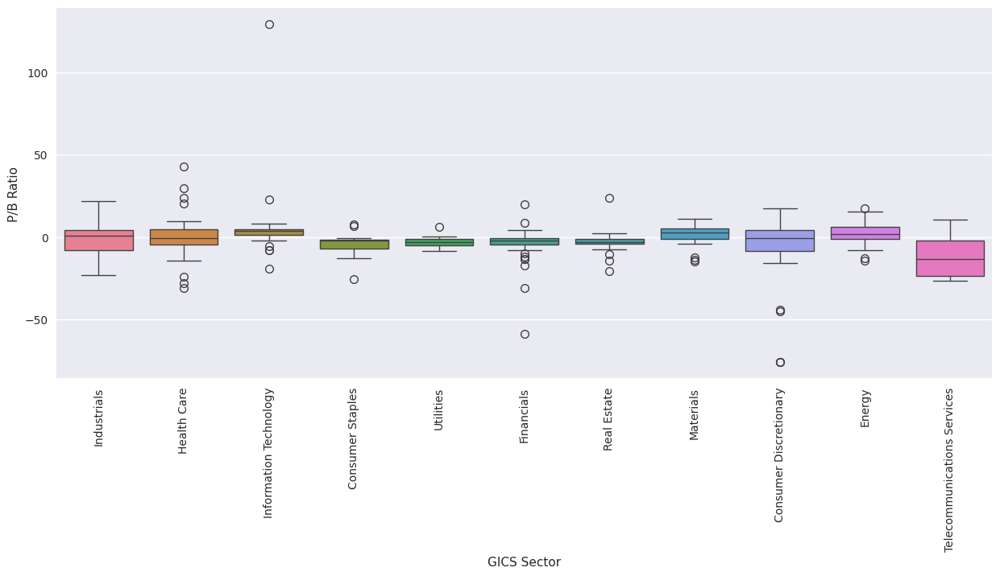

Mean P/B Ratio by GICS Sector:
GICS Sector
Consumer Discretionary         -8.25
Consumer Staples               -4.55
Energy                          2.54
Financials                     -4.27
Health Care                     0.07
Industrials                    -0.98
Information Technology          6.38
Materials                       0.72
Real Estate                    -3.00
Telecommunications Services   -11.01
Utilities                      -3.09
Name: P/B Ratio, dtype: float64


In [114]:
sns.boxplot(data=eda, x='GICS Sector', y='P/B Ratio', hue = "GICS Sector")
plt.xticks(rotation=90)
plt.show()
print(f"Mean P/B Ratio by GICS Sector:\n{eda.groupby('GICS Sector')['P/B Ratio'].mean()}")

Only four sectors have postive average P/B ratios indicating that they have more assets than liabilities.  Those sectors are Information Technology, Energy, Materials, and Health Care.  While the rest are negative, Telecommunication Services and Consumer Discretionary are the two most negative.

###Observations on Bivariate Numerical Variables

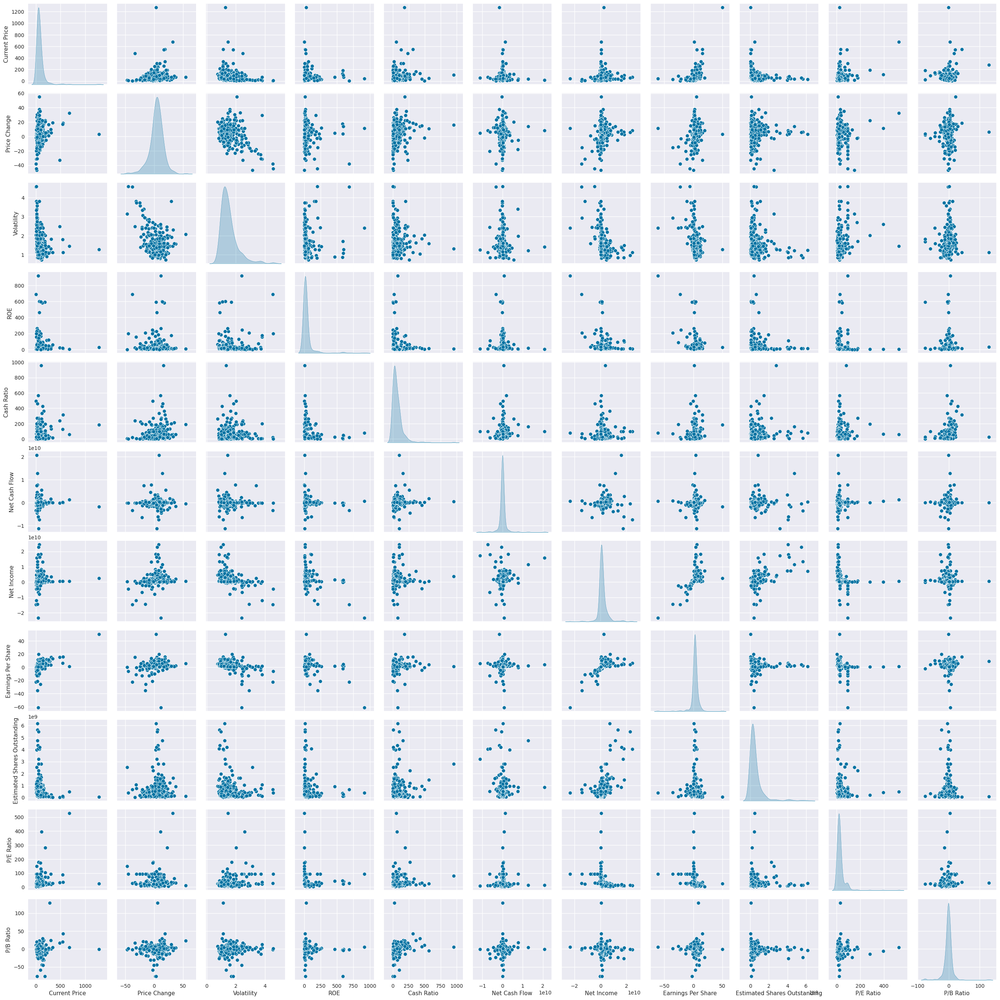

In [115]:
#pairplots of all numerica variables in eda
sns.pairplot(eda, diag_kind = "kde")
plt.show()

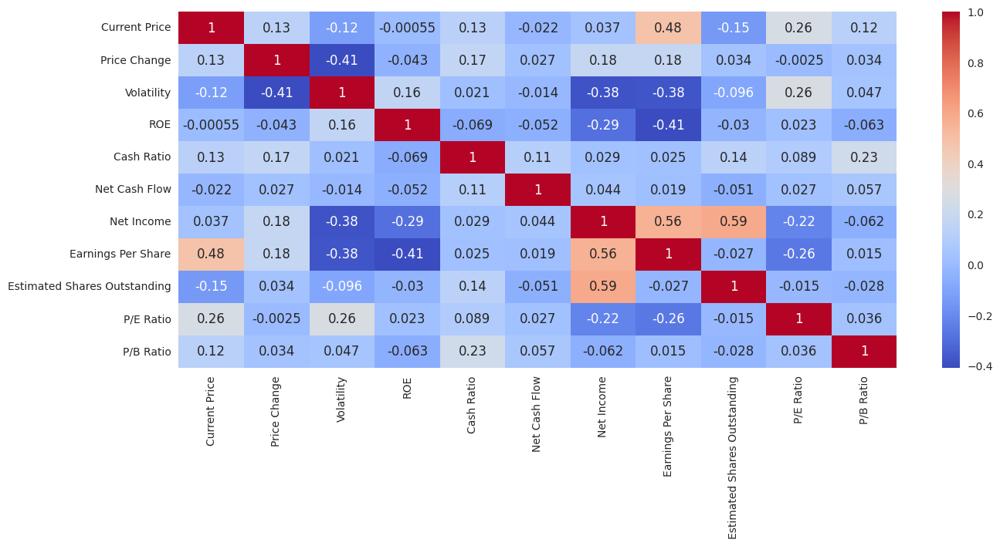

In [116]:
#pull all numerical variables from the eda dataset
eda_corr = eda.corr(numeric_only=True)
sns.heatmap(eda_corr, annot = True, cmap = 'coolwarm')
plt.show()

As seen in the pairplot and correlation matrix above, earnings per share is moderately correlated with current price and net income.  Estimated shares outstanding is positively correlated with net income. Volatility is negatively correlated with net income, earnings per share, and price change. Whiel ROE is negatively correlated with earnings per share. Other variables may have non-linear correlations, such as Estimated shares outstanding and current price, which appear to have an exponential relationship.

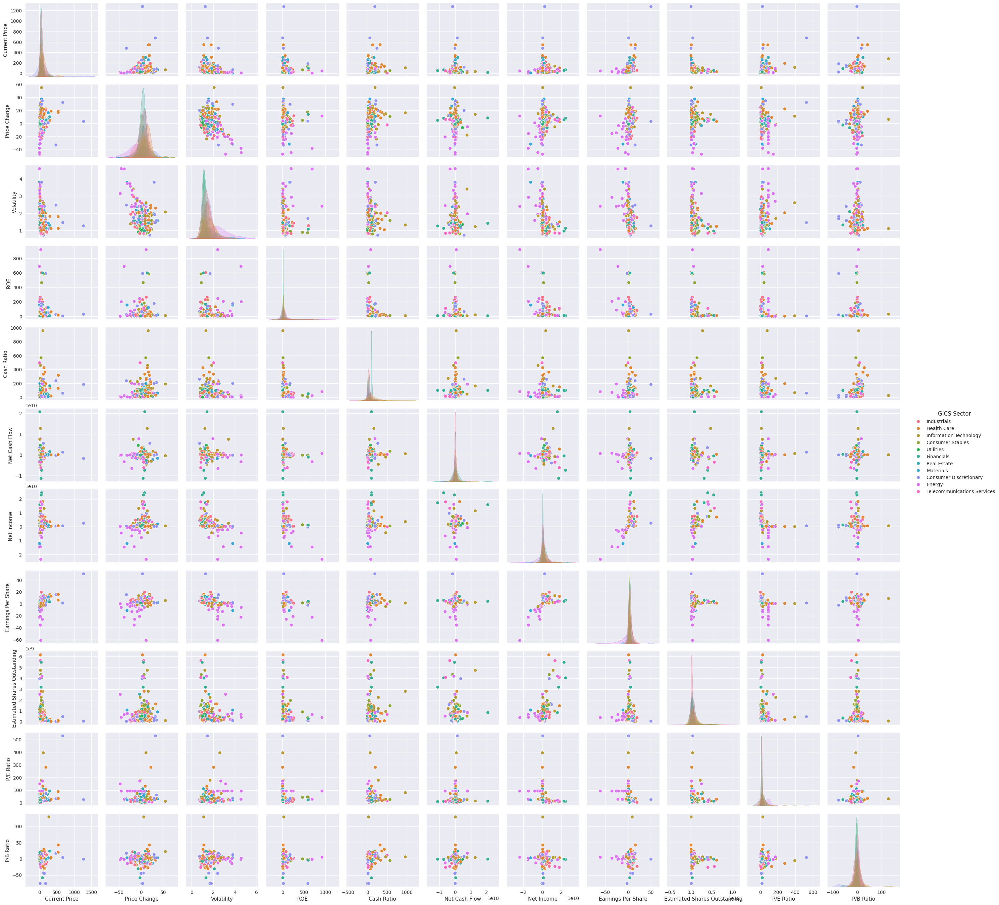

In [117]:
#pairplots of all numerica variables in eda
sns.pairplot(eda, diag_kind = "kde", hue = "GICS Sector")
plt.show()

Based on the density of each plot, there does not appear to be any distinct pattern when the dots are shaded based on GICS Sector.